### Section 1: Loading modules and functions

In [1]:
#######################
### LOAD IN MODULES ###
#######################

import cv2 # to install on mac: pip install opencv-python
from scipy.interpolate import interp1d # for interpolating points
from sklearn.decomposition import PCA # for principal component analysis
from scipy.spatial import procrustes # for Procrustes analysis
from scipy.spatial import ConvexHull # for convex hull
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis # for LDA
from sklearn.metrics import confusion_matrix # for confusion matrix
import os
from os import listdir # for retrieving files from directory
from os.path import isfile, join # for retrieving files from directory
import matplotlib.pyplot as plt # for plotting
%matplotlib inline
import numpy as np # for using arrays
import math # for mathematical operations
import pandas as pd # for using pandas dataframes
import seaborn as sns # for plotting in seaborna
import csv
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score

In [2]:
#################
### FUNCTIONS ###
#################

def angle_between(p1, p2, p3):
    """
    define a function to find the angle between 3 points anti-clockwise in degrees, p2 being the vertex
    inputs: three angle points, as tuples
    output: angle in degrees
    """
    x1, y1 = p1
    x2, y2 = p2
    x3, y3 = p3
    deg1 = (360 + math.degrees(math.atan2(x1 - x2, y1 - y2))) % 360
    deg2 = (360 + math.degrees(math.atan2(x3 - x2, y3 - y2))) % 360
    return deg2 - deg1 if deg1 <= deg2 else 360 - (deg1 - deg2)

def rotate_points(xvals, yvals, degrees):
    """"
    define a function to rotate 2D x and y coordinate points around the origin
    inputs: x and y vals (can take pandas dataframe columns) and the degrees (positive, anticlockwise) to rotate
    outputs: rotated and y vals
    """
    angle_to_move = 90-degrees
    rads = np.deg2rad(angle_to_move)
    
    new_xvals = xvals*np.cos(rads)-yvals*np.sin(rads)
    new_yvals = xvals*np.sin(rads)+yvals*np.cos(rads)
    
    return new_xvals, new_yvals

def interpolation(x, y, number): 
    """
    define a function to return equally spaced, interpolated points for a given polyline
    inputs: arrays of x and y values for a polyline, number of points to interpolate
    ouputs: interpolated points along the polyline, inclusive of start and end points
    """
    distance = np.cumsum(np.sqrt( np.ediff1d(x, to_begin=0)**2 + np.ediff1d(y, to_begin=0)**2 ))
    distance = distance/distance[-1]

    fx, fy = interp1d( distance, x ), interp1d( distance, y )

    alpha = np.linspace(0, 1, number)
    x_regular, y_regular = fx(alpha), fy(alpha)
    
    return x_regular, y_regular

def euclid_dist(x1, y1, x2, y2):
    """
    define a function to return the euclidean distance between two points
    inputs: x and y values of the two points
    output: the eulidean distance
    """
    return np.sqrt((x2-x1)**2 + (y2-y1)**2)

def poly_area(x,y):
    """
    define a function to calculate the area of a polygon using the shoelace algorithm
    inputs: separate numpy arrays of x and y coordinate values
    outputs: the area of the polygon
    """
    return 0.5*np.abs(np.dot(x,np.roll(y,1))-np.dot(y,np.roll(x,1)))

def gpa_mean(leaf_arr, landmark_num, dim_num):
    
    """
    define a function that given an array of landmark data returns the Generalized Procrustes Analysis mean
    inputs: a 3 dimensional array of samples by landmarks by coordinate values, number of landmarks, number of dimensions
    output: an array of the Generalized Procrustes Analysis mean shape
    
    """

    ref_ind = 0 # select arbitrary reference index to calculate procrustes distances to
    ref_shape = leaf_arr[ref_ind, :, :] # select the reference shape

    mean_diff = 10**(-30) # set a distance between means to stop the algorithm

    old_mean = ref_shape # for the first comparison between means, set old_mean to an arbitrary reference shape

    d = 1000000 # set d initially arbitraily high

    while d > mean_diff: # set boolean criterion for Procrustes distance between mean to stop calculations

        arr = np.zeros( ((len(leaf_arr)),landmark_num,dim_num) ) # empty 3D array: # samples, landmarks, coord vals

        for i in range(len(leaf_arr)): # for each leaf shape 

            s1, s2, distance = procrustes(old_mean, leaf_arr[i]) # calculate procrustes adjusted shape to ref for current leaf
            arr[i] = s2 # store procrustes adjusted shape to array

        new_mean = np.mean(arr, axis=(0)) # calculate mean of all shapes adjusted to reference

        s1, s2, d = procrustes(old_mean, new_mean) # calculate procrustes distance of new mean to old mean

        old_mean = new_mean # set the old_mean to the new_mea before beginning another iteration

    return new_mean

def Circularity(shape_arr):
    
    lines = np.hstack([shape_arr,np.roll(shape_arr,-1,axis=0)])
    area = 0.5*abs(sum(x1*y2-x2*y1 for x1,y1,x2,y2 in lines))
    
    distance = np.cumsum(np.sqrt( np.ediff1d(shape_arr[:,0], to_begin=0)**2 + np.ediff1d(shape_arr[:,1], to_begin=0)**2 ))
    perimeter = distance[-1]
    
    circularity = (4*math.pi*area)/perimeter**2
    
    return circularity


In [3]:
def process_leaf_data(mdata):
    ######################
    ### SET PARAMETERS ###
    ######################

    high_res_pts = 1000
    res = 50  # Total pseudo-landmarks = 2 * res - 1

    # Create empty array to store all leaves' cm-scaled pseudo-landmarks
    cm_arr = np.zeros((len(mdata), (res * 2) - 1, 2))

    # Process each leaf
    for lf in range(len(mdata)):

        ###############################
        ### READ IN GRAYSCALE IMAGE ###
        ###############################

        curr_image = mdata["file"][lf]
        print(lf, curr_image)

        img = cv2.bitwise_not(cv2.cvtColor(cv2.imread(data_dir + curr_image),cv2.COLOR_BGR2GRAY))
        contours, _ = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        ##############################
        ### SELECT LARGEST CONTOUR ###
        ##############################

        x_conts, y_conts, areas_conts = [], [], []

        for c in contours:
            x_vals = [pt[0][0] for pt in c]
            y_vals = [pt[0][1] for pt in c]
            area = (max(x_vals) - min(x_vals)) * (max(y_vals) - min(y_vals))
            x_conts.append(x_vals)
            y_conts.append(y_vals)
            areas_conts.append(area)

        area_inds = np.flip(np.argsort(areas_conts))
        sorted_x_conts = np.array(x_conts, dtype=object)[area_inds]
        sorted_y_conts = np.array(y_conts, dtype=object)[area_inds]

        ################################################
        ### INTERPOLATE HIGH RES NUMBER OF LANDMARKS ###
        ################################################

        high_res_x, high_res_y = interpolation(
            sorted_x_conts[0], sorted_y_conts[0], high_res_pts
        )

        ###############################
        ### FIND BASE AND TIP INDEX ###
        ###############################

        base_pt = np.array((mdata["base_x"][lf], mdata["base_y"][lf]))
        tip_pt = np.array((mdata["tip_x"][lf], mdata["tip_y"][lf]))

        base_dists = [
            euclid_dist(base_pt[0], base_pt[1], high_res_x[pt], high_res_y[pt])
            for pt in range(len(high_res_x))
        ]
        tip_dists = [
            euclid_dist(tip_pt[0], tip_pt[1], high_res_x[pt], high_res_y[pt])
            for pt in range(len(high_res_x))
        ]

        base_ind = np.argmin(base_dists)
        tip_ind = np.argmin(tip_dists)

        ################################
        ### RESET BASE INDEX TO ZERO ###
        ################################

        high_res_x = np.concatenate((high_res_x[base_ind:], high_res_x[:base_ind]))
        high_res_y = np.concatenate((high_res_y[base_ind:], high_res_y[:base_ind]))

        tip_ind = tip_ind - base_ind
        base_ind = 0

        lf_contour = np.column_stack((high_res_x, high_res_y))

        ##############################################################
        ### INTERPOLATE EACH SIDE WITH DESIRED NUMBER OF LANDMARKS ###
        ##############################################################

        left_inter_x, left_inter_y = interpolation(
            lf_contour[base_ind:tip_ind+1, 0], lf_contour[base_ind:tip_ind+1, 1], res
        )
        right_inter_x, right_inter_y = interpolation(
            lf_contour[tip_ind:, 0], lf_contour[tip_ind:, 1], res
        )

        left_inter_x = np.delete(left_inter_x, -1)
        left_inter_y = np.delete(left_inter_y, -1)

        lf_pts_left = np.column_stack((left_inter_x, left_inter_y))
        lf_pts_right = np.column_stack((right_inter_x, right_inter_y))
        lf_pts = np.row_stack((lf_pts_left, lf_pts_right))

        ##########################################################
        ### ROTATE LEAVES UPWARD AND SCALE SIZE TO CENTIMETERS ###
        ##########################################################

        tip_point = lf_pts[res-1, :]
        base_point = lf_pts[0, :]

        ang = angle_between(tip_point, base_point, (base_point[0]+1, base_point[1]))

        rot_x, rot_y = rotate_points(lf_pts[:, 0], lf_pts[:, 1], ang)
        rot_pts = np.column_stack((rot_x, rot_y))

        cm_lf = rot_pts / mdata["px_cm"][lf]
        cm_arr[lf, :, :] = cm_lf

    return cm_arr

In [4]:
#change working directory 
os.chdir('/Volumes/TOSHIBA/fruit_capsella/all_data/')

### Section 2: Reading in Data

If your image data includes only outlines (xy coordinate files) follow subsection 1. If your image data includes only black leaf images printed on white backgound, follow subsection 2. 

##### Subsection 1: Reading in leaf outline data

##### Subsection 2: Reading in binary leaf image data

Steps
1. Change the directory where your files are located. This should be one folder that includes another folder of all images you want to include in your data set and a csv file.
2. Import your metadata csv as a pandas dataframe named mdata. The csv file should include these headings: file - the file name for each image, dataset - researcher defined, px_cm - pixels per centimeter, base_x and base_y - the x and y coordinates for the base of each leaf, tip_x and tip_y - the x and y coordinates for the tip of each leaf.
3. Upload your images into the "data_dir" data directory using the file path for the folder with all of your images files for your dataset. 
4. Print the mdata dataframe and image file names to check for any errors. Most errors occur at this step.

In [10]:
mdata = pd.read_csv("all_data_with_angle_112425.csv") # read in csv

mdata.head() # head data to check

,file,dataset,genotype,plant,px_cm,base_x,base_y,tip_x,tip_y,L_x,L_y,R_x,R_y,M_x,M_y
0,14.2_15_16_set5_rep1_fruit1.jpg,16,14.2,as,300,486,149,33.5,131.5,40.0,246.0,58.5,23.5,144.5,122.5
1,14.2_15_16_set5_rep1_fruit10.jpg,16,14.2,as,300,486,195,48.5,158.5,42.0,293.0,77.5,29.5,184.5,163.5
2,14.2_15_16_set5_rep1_fruit2.jpg,16,14.2,as,300,484,159,36.5,157.5,48.0,297.0,55.5,31.5,181.5,161.5
3,14.2_15_16_set5_rep1_fruit3.jpg,16,14.2,as,300,483,151,41.5,125.5,43.0,236.0,55.5,30.5,155.5,132.5
4,14.2_15_16_set5_rep1_fruit4.jpg,16,14.2,as,300,487,156,32.5,150.5,53.0,284.0,50.5,33.5,171.5,146.5


In [11]:
len(mdata)

641

In [9]:
#######################################
### MAKE A LIST OF IMAGE FILE NAMES ###
#######################################

data_dir = "./all_jpgs/" # set data directory

file_names = [f for f in listdir(data_dir) if isfile(join(data_dir, f))] # create a list of file names

#file_names.remove('.DS_Store') # remove .DS_Store file

file_names.sort() # sort the list of file names

file_names # check list of file names

["'.jpg",
 '14.2_15_16_set5_rep1_fruit1 2.jpg',
 '14.2_15_16_set5_rep1_fruit1.jpg',
 '14.2_15_16_set5_rep1_fruit10 2.jpg',
 '14.2_15_16_set5_rep1_fruit10.jpg',
 '14.2_15_16_set5_rep1_fruit2 2.jpg',
 '14.2_15_16_set5_rep1_fruit2.jpg',
 '14.2_15_16_set5_rep1_fruit3 2.jpg',
 '14.2_15_16_set5_rep1_fruit3.jpg',
 '14.2_15_16_set5_rep1_fruit4 2.jpg',
 '14.2_15_16_set5_rep1_fruit4.jpg',
 '14.2_15_16_set5_rep1_fruit5 2.jpg',
 '14.2_15_16_set5_rep1_fruit5.jpg',
 '14.2_15_16_set5_rep1_fruit6 2.jpg',
 '14.2_15_16_set5_rep1_fruit6.jpg',
 '14.2_15_16_set5_rep1_fruit7 2.jpg',
 '14.2_15_16_set5_rep1_fruit7.jpg',
 '14.2_15_16_set5_rep1_fruit8 2.jpg',
 '14.2_15_16_set5_rep1_fruit8.jpg',
 '14.2_15_16_set5_rep1_fruit9 2.jpg',
 '14.2_15_16_set5_rep1_fruit9.jpg',
 '14.2_15_16_set5_rep2_fruit1.jpg',
 '14.2_15_16_set5_rep2_fruit10.jpg',
 '14.2_15_16_set5_rep2_fruit18.jpg',
 '14.2_15_16_set5_rep2_fruit2.jpg',
 '14.2_15_16_set5_rep2_fruit3.jpg',
 '14.2_15_16_set5_rep2_fruit4.jpg',
 '14.2_15_16_set5_rep2_fruit5.

### Section 3: Place equidistant pseudo-landmarks

- Read in image in grayscale
- Select the contour of the largest object (the leaf)
- Interpolate with a high resolution of pseudo-landmarks
- Find the base and tip index point on the high resolution contour
- Reset the base index to zero
- Interpolate each side with desired number of equidistant pseudo-landmarks
- Rotate leaves and scale to centimeters
- Save pseudo-landmarks scaled to centimeters in an array

PARAMETERS AND INDEXING:
- `high_res_pts` is an arbitrarily high number of points to initially interpolate
- `res` is the desired number of points to interpolate on each side of the leaf
- The total number of pseudo-landmarks will be `2*res - 1`
- The base index will be `0`
- The tip index will be `res-1`
- The returned leaves in `cm_arr` are scaled in size to centimeters

In [12]:
######################
### SET PARAMETERS ###
######################

# the number of equidistant points to create
# an initial high resolution outline of the leaf
high_res_pts = 1000 

# the ultimate number of equidistant points on each side of the leaf
# (-1 for the tip)
# the leaf will have res*2-1 pseudo-landmarks
#################
#################
#################
res = 50 ########
#################
#################
#################

# an array to store pseudo-landmarks
cm_arr = np.zeros((len(mdata),(res*2)-1,2))

# for each leaf . . .
for lf in range(len(mdata)):

    ###############################
    ### READ IN GRAYSCALE IMAGE ###
    ###############################

    curr_image = mdata["file"][lf] # select the current image
    print(lf, curr_image) # print each leaf in case there are problems later

    # read in image
    # convert to grayscale
    # invert the binary
    img = cv2.bitwise_not(cv2.cvtColor(cv2.imread(data_dir + curr_image),cv2.COLOR_BGR2GRAY))

    # find contours of binary objects
    contours, hierarchy = cv2.findContours(img,  
        cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE) 

    ##############################
    ### SELECT LARGEST CONTOUR ###
    ##############################

    # ideally there is only one leaf in the image
    # in the case there are smaller objects
    # this code selects the largest object (the leaf)
    # if there is one and only one object in the image
    # then the following code is not necessary

    x_conts = [] # list of lists of contour x vals
    y_conts = [] # list of lists of contour y vals
    areas_conts = [] # list of bounding box areas of contours
    for c in contours: # for each contour
        x_vals = [] # store x vals for current contour 
        y_vals = [] # store y vals for current contour
        for i in range(len(c)): # for each point in current contour
            x_vals.append(c[i][0][0]) # isolate x val
            y_vals.append(c[i][0][1]) # isolate y val
        area = (max(x_vals) - min(x_vals))*(max(y_vals) - min(y_vals)) # calculate bounding box area of contour
        x_conts.append(x_vals) # append the current contour x vals
        y_conts.append(y_vals) # append the current contour y vals
        areas_conts.append(area) # append the current contour bounding box areas

    area_inds = np.flip(np.argsort(areas_conts)) # get indices to sort contours by area
    sorted_x_conts = np.array(x_conts, dtype=object)[area_inds][0:] # areas sorted largest to smallest, x vals
    sorted_y_conts = np.array(y_conts, dtype=object)[area_inds][0:] # areas sorted largest to smallest, y vals

    ################################################
    ### INTERPOLATE HIGH RES NUMBER OF LANDMARKS ###
    ################################################

    # convert the leaf to high resolution number of landmarks
    # using high_res_pt value
    # need to convert arrays of pixel int to floats first
    high_res_x, high_res_y = interpolation(sorted_x_conts[0], 
                                           sorted_y_conts[0], high_res_pts)

    ###############################
    ### FIND BASE AND TIP INDEX ###
    ###############################

    # get the base and tip landmark point values
    base_pt = np.array((mdata["base_x"][lf], mdata["base_y"][lf]))
    tip_pt = np.array((mdata["tip_x"][lf], mdata["tip_y"][lf]))

    base_dists = [] # store distance of each high res point to base
    tip_dists = [] # store distance of each high res point to tip

    for pt in range(len(high_res_x)): # for each of the high resolution points

        # euclidean distance of the current point from the base and tip landmark
        ed_base = euclid_dist(base_pt[0], base_pt[1], high_res_x[pt], high_res_y[pt])
        ed_tip = euclid_dist(tip_pt[0], tip_pt[1], high_res_x[pt], high_res_y[pt])

        # store distance of current point from base/tip
        base_dists.append(ed_base)
        tip_dists.append(ed_tip)

    # get index of base and tip points
    base_ind = np.argmin(base_dists)
    tip_ind = np.argmin(tip_dists)

    ################################
    ### RESET BASE INDEX TO ZERO ###
    ################################

    # reset base index position to zero
    high_res_x = np.concatenate((high_res_x[base_ind:],high_res_x[:base_ind]))
    high_res_y = np.concatenate((high_res_y[base_ind:],high_res_y[:base_ind]))

    # recalculate indices with new indexing
    tip_ind = tip_ind-base_ind # note: negative index if tip_ind<base_ind
    base_ind = base_ind-base_ind

    # create single array for leaf coordinates
    lf_contour = np.column_stack((high_res_x, high_res_y))

    ##############################################################
    ### INTERPOLATE EACH SIDE WITH DESIRED NUMBER OF LANDMARKS ###
    ##############################################################

    # interpolate at desired resolution the left and right sides of the leaf
    left_inter_x, left_inter_y = interpolation(lf_contour[base_ind:tip_ind+1,0],lf_contour[base_ind:tip_ind+1,1],res)
    right_inter_x, right_inter_y = interpolation(lf_contour[tip_ind:,0],lf_contour[tip_ind:,1],res)

    # the start of the right side and end of the left side
    # both contain the tip landmark
    # delete the last point on the left side
    left_inter_x = np.delete(left_inter_x, -1)
    left_inter_y = np.delete(left_inter_y, -1)

    # BASE OF LEAF IS INDEX 0
    # TIP INDEX IS RES-1 IF BOTH LEFT & RIGHT POINTS
    # TOTAL PSEUDOLANDMARKS IS 2*RES-1
    lf_pts_left = np.column_stack((left_inter_x, left_inter_y))
    lf_pts_right = np.column_stack((right_inter_x, right_inter_y))
    lf_pts = np.row_stack((lf_pts_left, lf_pts_right))

    ##########################################################
    ### ROTATE LEAVES UPWARD AND SCALE SIZE TO CENTIMETERS ###
    ##########################################################

    tip_point = lf_pts[res-1,:] # get tip point
    base_point = lf_pts[0,:] # get base point

    # calculate angle between tip. base, and an arbitrary reference
    ang = angle_between(tip_point, base_point, (base_point[0]+1,base_point[1]) )

    # rotate points upwards
    rot_x, rot_y = rotate_points(lf_pts[:,0], lf_pts[:,1], ang) 
    rot_pts = np.column_stack((rot_x, rot_y))

    # scale leaf into cm
    cm_lf = rot_pts/(mdata["px_cm"][lf])
    
    # store the leaf scaled into cm into the cm_arr
    cm_arr[lf,:,:] = cm_lf

0 14.2_15_16_set5_rep1_fruit1.jpg
1 14.2_15_16_set5_rep1_fruit10.jpg
2 14.2_15_16_set5_rep1_fruit2.jpg
3 14.2_15_16_set5_rep1_fruit3.jpg
4 14.2_15_16_set5_rep1_fruit4.jpg
5 14.2_15_16_set5_rep1_fruit5.jpg
6 14.2_15_16_set5_rep1_fruit6.jpg
7 14.2_15_16_set5_rep1_fruit7.jpg
8 14.2_15_16_set5_rep1_fruit8.jpg
9 14.2_15_16_set5_rep1_fruit9.jpg
10 14.2_15_16_set5_rep3_fruit1.jpg
11 14.2_15_16_set5_rep3_fruit10.jpg
12 14.2_15_16_set5_rep3_fruit2.jpg
13 14.2_15_16_set5_rep3_fruit3.jpg
14 14.2_15_16_set5_rep3_fruit4.jpg
15 14.2_15_16_set5_rep3_fruit5.jpg
16 14.2_15_16_set5_rep3_fruit6.jpg
17 14.2_15_16_set5_rep3_fruit7.jpg
18 14.2_15_16_set5_rep3_fruit8.jpg
19 14.2_15_16_set5_rep3_fruit9.jpg
20 14.2_17_30_set3_rep1_fruit1.jpg
21 14.2_17_30_set3_rep1_fruit2.jpg
22 14.2_17_30_set3_rep1_fruit3.jpg
23 14.2_17_30_set3_rep1_fruit4.jpg
24 14.2_17_30_set3_rep2_fruit1.jpg
25 14.2_17_30_set3_rep2_fruit2.jpg
26 14.2_17_30_set3_rep2_fruit3.jpg
27 14.2_17_30_set3_rep2_fruit4.jpg
28 14.2_17_30_set3_rep2_frui

244 fruit_5_6c_17_30_set2_rep3_image2.jpg
245 fruit_5_6C_8_20_set3_rep2.jpg
246 fruit_5_6C_8_20_set3_rep3.jpg
247 fruit_5_gc_8_20_set2_rep3.jpg
248 fruit_6_142_8_20_set3_rep2.jpg
249 fruit_6_142_8_20_set3_rep3.jpg
250 fruit_6_20295_8_20_set3_rep2.jpg
251 fruit_6_20295_8_20_set3_rep3.jpg
252 fruit_6_2095_8_20_set2_rep1.jpg
253 fruit_6_6c_17_30_set2_rep3_image2.jpg
254 fruit_6_6C_8_20_set3_rep2.jpg
255 fruit_6_6C_8_20_set3_rep3.jpg
256 fruit_6_gc_8_20_set2_rep3.jpg
257 fruit_7_142_8_20_set3_rep2.jpg
258 fruit_7_142_8_20_set3_rep3.jpg
259 fruit_7_20295_8_20_set3_rep2.jpg
260 fruit_7_20295_8_20_set3_rep3.jpg
261 fruit_7_2095_8_20_set2_rep1.jpg
262 fruit_7_6c_17_30_set2_rep3_image3.jpg
263 fruit_7_6C_8_20_set3_rep2.jpg
264 fruit_7_6C_8_20_set3_rep3.jpg
265 fruit_7_gc_8_20_set2_rep3.jpg
266 fruit_8_142_8_20_set3_rep2.jpg
267 fruit_8_142_8_20_set3_rep3.jpg
268 fruit_8_20295_8_20_set3_rep2.jpg
269 fruit_8_20295_8_20_set3_rep3.jpg
270 fruit_8_2095_8_20_set2_rep1.jpg
271 fruit_8_6c_8_20_set2_rep

484 14.2_8_20_set5_rep1_fruit2.jpg
485 14.2_8_20_set5_rep1_fruit3.jpg
486 14.2_8_20_set5_rep1_fruit4.jpg
487 14.2_8_20_set5_rep1_fruit6.jpg
488 14.2_8_20_set5_rep1_fruit7.jpg
489 14.2_8_20_set5_rep1_fruit8.jpg
490 14.2_8_20_set5_rep1_fruit9.jpg
491 14.2_8_20_set5_rep1_fruit10.jpg
492 14.2_8_20_set5_rep2_fruit1.jpg
493 14.2_8_20_set5_rep2_fruit2.jpg
494 14.2_8_20_set5_rep2_fruit3.jpg
495 14.2_8_20_set5_rep2_fruit4.jpg
496 14.2_8_20_set5_rep2_fruit5.jpg
497 14.2_8_20_set5_rep2_fruit6.jpg
498 14.2_8_20_set5_rep2_fruit7.jpg
499 14.2_8_20_set5_rep2_fruit8.jpg
500 14.2_8_20_set5_rep2_fruit9.jpg
501 14.2_8_20_set5_rep2_fruit10.jpg
502 14.2_8_20_set5_rep3_fruit1.jpg
503 14.2_8_20_set5_rep3_fruit2.jpg
504 14.2_8_20_set5_rep3_fruit3.jpg
505 14.2_8_20_set5_rep3_fruit4.jpg
506 14.2_8_20_set5_rep3_fruit5.jpg
507 14.2_8_20_set5_rep3_fruit6.jpg
508 14.2_8_20_set5_rep3_fruit7.jpg
509 14.2_8_20_set5_rep3_fruit8.jpg
510 14.2_8_20_set5_rep3_fruit10.jpg
511 14.2_8_20_set5_rep3_fruit19.jpg
512 14.2_15_16_s

### Section 4: Procurestes Analysis and PCA

Perform a Procrustes analysis to translate, scale, and rotate leaf shapes

- Select number of pseudo-landmarks and dimensions
- Calculate the GPA mean leaf shape using the `gpa_mean` function
- Align all leaves to the GPA mean
- Store Procrustes super-imposed leaves in an array, `proc_arr`
- Calculate a PCA for all possible axes and their variance (the number of leaves)
- Calculate a PCA for just the axes needed for reconstruction of eigenleaves for morphospace (probably 2)

In [13]:
landmark_num = (res*2)-1 # select number of landmarks
dim_num = 2 # select number of coordinate value dimensions

##########################
### CALCULATE GPA MEAN ###
##########################

mean_shape = gpa_mean(cm_arr, landmark_num, dim_num)

################################
### ALIGN LEAVES TO GPA MEAN ###
################################

# array to store Procrustes aligned shapes
proc_arr = np.zeros(np.shape(cm_arr)) 

for i in range(len(cm_arr)):
    s1, s2, distance = procrustes(mean_shape, cm_arr[i,:,:]) # calculate procrustes adjusted shape to ref for current leaf
    proc_arr[i] = s2 # store procrustes adjusted shape to array
    
#################################################
### FIRST, CALCULATE PERCENT VARIANCE ALL PCs ###
#################################################

######
PC_NUMBER = np.shape(proc_arr)[1] # PC number = number of leaves
#######

# use the reshape function to flatten to 2D
flat_arr = proc_arr.reshape(np.shape(proc_arr)[0], 
                                 np.shape(proc_arr)[1]*np.shape(proc_arr)[2]) 

pca_all = PCA(n_components=2) 
PCs_all = pca_all.fit_transform(flat_arr) # fit a PCA for all data

# print out explained variance for each PC
print("PC: " + "var, " + "overall ") 
for i in range(len(pca_all.explained_variance_ratio_)):
    print("PC" + str(i+1) + ": " + str(round(pca_all.explained_variance_ratio_[i]*100,1)) + 
          "%, " + str(round(pca_all.explained_variance_ratio_.cumsum()[i]*100,1)) + "%"  )

#################################################
### NEXT, CALCULATE THE DESIRED NUMBER OF PCs ###
#################################################

######
PC_NUMBER = 2 # PC number = 2, for limiting to 2 axes for morphospace reconstruction
#######

pca = PCA(n_components=PC_NUMBER) 
PCs = pca.fit_transform(flat_arr) # fit a PCA for only desired PCs

# print out explained variance for each PC
print("PC: " + "var, " + "overall ") 
for i in range(len(pca.explained_variance_ratio_)):
    print("PC" + str(i+1) + ": " + str(round(pca.explained_variance_ratio_[i]*100,1)) + 
          "%, " + str(round(pca.explained_variance_ratio_.cumsum()[i]*100,1)) + "%"  )
    
# add PCs to dataframe for plotting
mdata["PC1"] = PCs[:,0]
mdata["PC2"] = PCs[:,1]

PC: var, overall 
PC1: 52.8%, 52.8%
PC2: 12.6%, 65.3%
PC: var, overall 
PC1: 52.8%, 52.8%
PC2: 12.6%, 65.3%


#### save array file

In [5]:
# Save rotated leaves with pseudo-landmarks
np.save('cm_arr', cm_arr)
#save procurestes aligned leaves
np.save('proc_arr', proc_arr)
#save flattened procurestes aligned leaves
np.save('flat_arr', flat_arr)

NameError: name 'cm_arr' is not defined

In [15]:
import os 
file_names = mdata['file']
output_directory = './reprinted_jpgs/'

for name, row in zip(file_names, proc_arr):
    filename = os.path.join(output_directory, f"{name}.txt")
    np.savetxt(filename, row, fmt='%.6f') 

### Section 5: Analyze leaf dimensions
Using placed pseudo-landmarks representing leaves that are rotated upwards and scaled in centimeters from `cm_arr`, calculate the following:

- `width`: difference in centimeters between minimum and maximum x values in an oriented leaf
- `length`: difference in centimeters between minimum and maximum y values in an oriented leaf
- `area`: area of the leaf in centimeters squared
- `solidity`: the ratio of area to convex hull area
- `asymmetry`: the Procrustes distance between the superimposed left and right sides of a leaf outline. Lower values are more symmetric. Higher values are more asymmetric.  

Data is stored in the `mdata` dataframe.

In [16]:
# lists to store variables
width_list = []
length_list = []
area_list = []
solidity_list = []
asymmetry_list = []

# for each leaf . . .
for lf in range(len(cm_arr)):
    
    # for calculating dimensions, we need non-scaled leaves in centimeters
    curr_lf = cm_arr[lf,:,:] # select current leaf
    
    ############################
    ### CALCULATE DIMENSIONS ###
    ############################
    
    width = np.max(curr_lf[:,0])-np.min(curr_lf[:,0]) # calculate width
    length = np.max(curr_lf[:,1])-np.min(curr_lf[:,1]) # calculate length
    area = poly_area(curr_lf[:,0],curr_lf[:,1]) # calcualte area
    
    ##########################
    ### CALCULATE SOLIDITY ###
    ##########################
    
    hull = ConvexHull(curr_lf) # calculate convex hull of current leaf
    vertices = hull.vertices # isolate vertex indices of convex hull
    convex_area = poly_area(curr_lf[vertices,0], curr_lf[vertices,1]) # calculate convex area
    solidity = area / convex_area # calculate solidity
    
    ##########################
    ### CALCULATE SYMMETRY ###
    ##########################
    
    left_side = curr_lf[:(res-1)+1,] # isolate left side of leaf
    right_side = curr_lf[(res-1):,] # isolate right side of leaf
    right_side = right_side[::-1] # reverse the right side to align indices with left

    # calculate procrustes distance between left and right side of leaf
    s1, s2, distance = procrustes(left_side, right_side) 
    
    # store data in lists
    width_list.append(width)
    length_list.append(length)
    area_list.append(area)
    solidity_list.append(solidity)
    asymmetry_list.append(distance)
    
# add data to the mdata dataframe
mdata["width"] = width_list
mdata["length"] = length_list
mdata["area"] = area_list
mdata["solidity"] = solidity_list
mdata["asymmetry"] = asymmetry_list

#NOTE: run procurstes 1st 
circularity_vals = []
aspect_ratio_vals = []

# for each Procrustes-adjusted shape
for i in range(np.shape(proc_arr)[0]):
    
    # select current shape
    curr_shape = proc_arr[i] 
    
    # calculate circularity and append to list
    circularity_vals.append(Circularity(curr_shape))
    
    # calculate length, width, and aspect ratio
    length = np.max(curr_shape[:,1]) - np.min(curr_shape[:,1])
    width = np.max(curr_shape[:,0]) - np.min(curr_shape[:,0])
    aspect_ratio_vals.append(width/length)
    
mdata['circ'] = circularity_vals
mdata['ar'] = aspect_ratio_vals

mdata.to_csv('metadata_111325.csv', header=True)

### Step 6: Pairplot of all measured traits

### Using R, add seed number, weight, and lateral shoot data to each individual by plant id. 

In [78]:
mdata2 = pd.read_csv('shape_data2_112425.csv')

In [6]:
mdata = pd.read_csv('shape_data2_112425.csv')

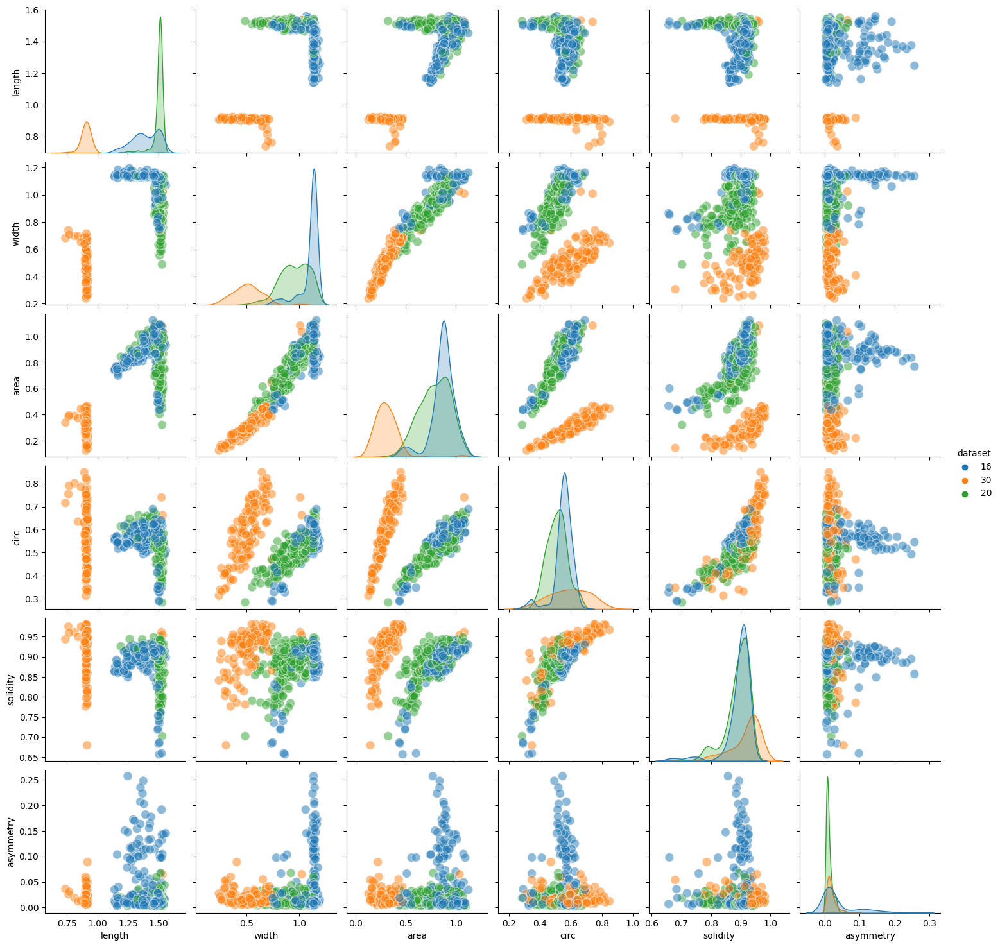

In [19]:
sns.pairplot(mdata2,
             x_vars=["length", "width", "area","circ", "solidity", "asymmetry"],
             y_vars=["length", "width", "area","circ", "solidity", "asymmetry"],
             hue="dataset",
             plot_kws={"s": 100, "alpha":0.5, "lw":0})

plt.savefig('pair_plot_dataset_111325.png', dpi= 600, bbox_inches='tight')

### Step 7: Morphospace of all fruits

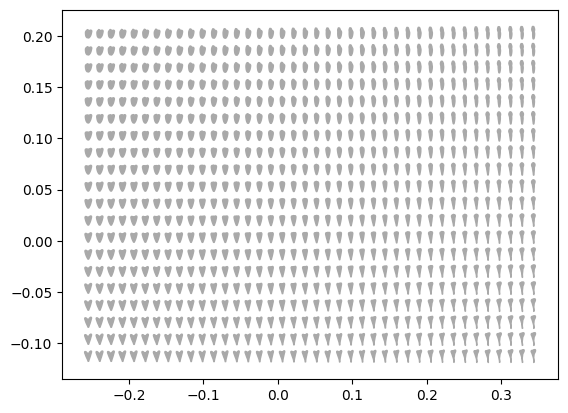

In [20]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 40 # set number of PC1 intervals
numPC2 = 20 # set number of PC2 intervals
hue = "genotype" # select the factor to color by
s = 0.04 # set the scale of the eigenleaves
lf_col = "darkgray" # color of inverse eigenleaf
lf_alpha = 1 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 0 # lw of data points, set to 0 for no edges
pt_alpha = 0.8 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
        
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
plt.savefig('dataset_morphospace_111325.png', dpi= 300, bbox_inches='tight')

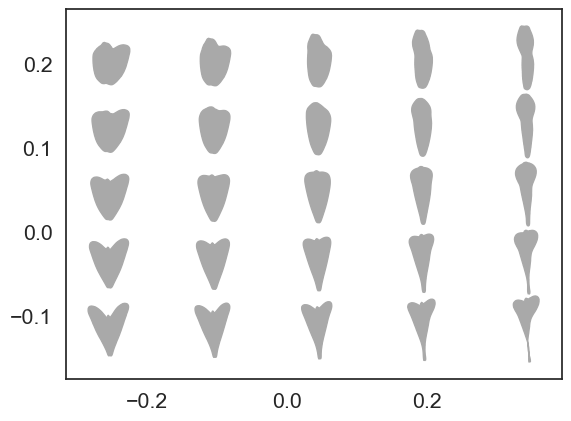

In [182]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 5 # set number of PC1 intervals
numPC2 = 5 # set number of PC2 intervals
hue = "genotype" # select the factor to color by
s = 0.25 # set the scale of the eigenleaves
lf_col = "darkgray" # color of inverse eigenleaf
lf_alpha = 1 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 0 # lw of data points, set to 0 for no edges
pt_alpha = 0.8 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)

sns.set_style("white")        
plt.savefig('dataset_morphospace_small_112525.png', dpi= 300, bbox_inches='tight')

### Step 8: Morphospace PCA

In [21]:
custom_palette = ["#FB9A99" , "#0B775E", "#35274A", "#F2300F", "#88CCEE"]

In [22]:
wes_pal = ["#F1BB7B", "#FD6467", "#5B1A18", "#D67236"]

In [23]:
wes_pal5 = ["#899DA4", "#C93312", "#FAEFD1", "#DC863B", "#5B1A18"]

# Morphospace by dataset and genotype

/var/folders/vs/v7f_krn941bb0m5f8qq1kqnh0000gn/T/ipykernel_31210/2686932436.py:39: UserWarning: The palette list has more values (4) than needed (3), which may not be intended.
  sns.scatterplot(data=mdata2, x="PC1", y="PC2", hue=hue, s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha,


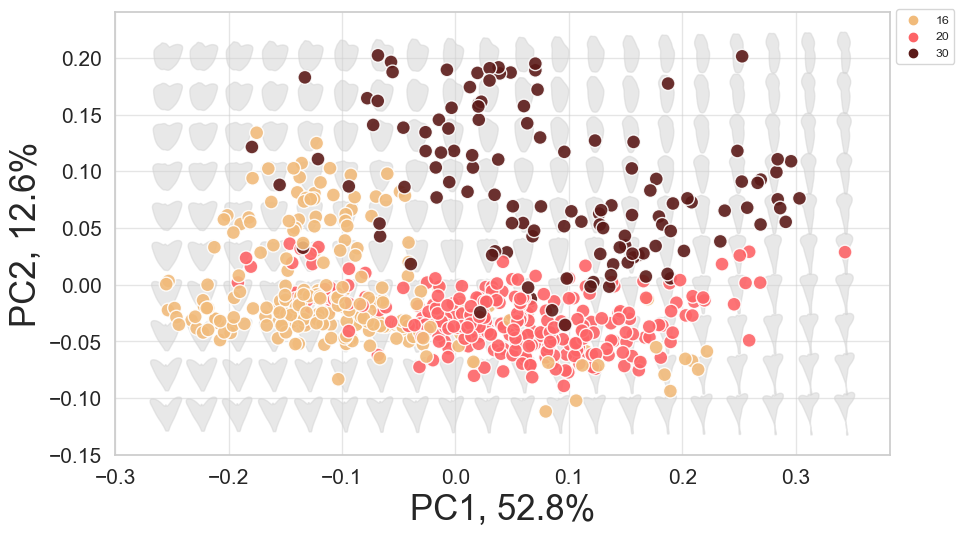

In [171]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 20 # set number of PC1 intervals
numPC2 = 10 # set number of PC2 intervals
hue = "dataset" # select the factor to color by
s = 0.12 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 0.50 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 0.90 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.set_style("whitegrid")
sns.scatterplot(data=mdata2, x="PC1", y="PC2", hue=hue, s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha, 
               palette = wes_pal)

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('morphospace_dataset_temp_111325.png', dpi= 300, bbox_inches='tight')

In [80]:
g20 = mdata2[mdata2['genotype']== "20.295"]
len(g20)

143

/var/folders/vs/v7f_krn941bb0m5f8qq1kqnh0000gn/T/ipykernel_31210/2798960204.py:39: UserWarning: The palette list has more values (4) than needed (3), which may not be intended.
  sns.scatterplot(data=g20, x="PC1", y="PC2", hue=hue, s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha,


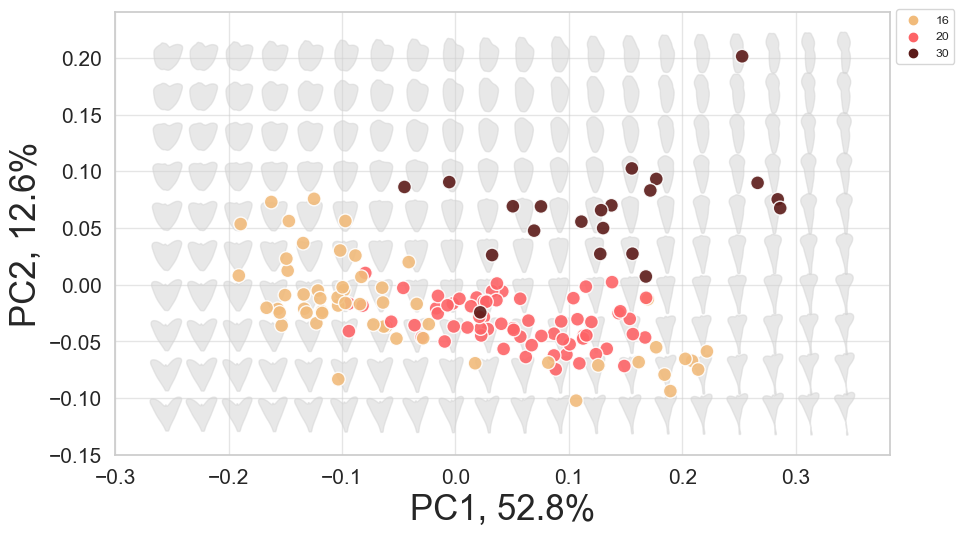

In [81]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 20 # set number of PC1 intervals
numPC2 = 10 # set number of PC2 intervals
hue = "dataset" # select the factor to color by
s = 0.12 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 0.50 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 0.90 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.set_style("whitegrid")
sns.scatterplot(data=g20, x="PC1", y="PC2", hue=hue, s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha, 
               palette = wes_pal)

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('morphospace_dataset_G20_111325.png', dpi= 300, bbox_inches='tight')

In [82]:
g6 = mdata2[mdata2['genotype']== "Magnolia6"]
len(g6)

187

/var/folders/vs/v7f_krn941bb0m5f8qq1kqnh0000gn/T/ipykernel_31210/3156624690.py:39: UserWarning: The palette list has more values (4) than needed (3), which may not be intended.
  sns.scatterplot(data=g6, x="PC1", y="PC2", hue=hue, s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha,


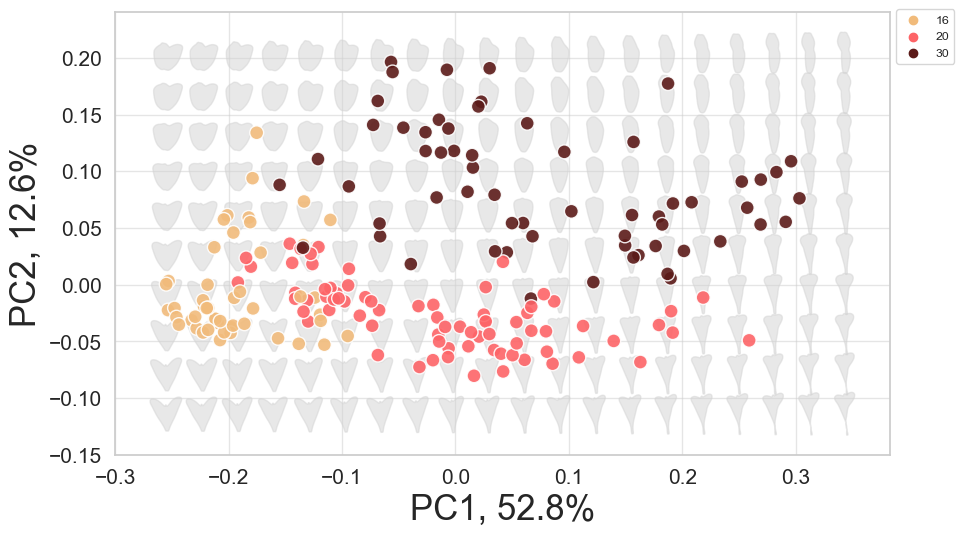

In [83]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 20 # set number of PC1 intervals
numPC2 = 10 # set number of PC2 intervals
hue = "dataset" # select the factor to color by
s = 0.12 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 0.50 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 0.90 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.set_style("whitegrid")
sns.scatterplot(data=g6, x="PC1", y="PC2", hue=hue, s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha, 
               palette = wes_pal)

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('morphospace_dataset_G6_111325.png', dpi= 300, bbox_inches='tight')

In [84]:
g7 = mdata2[mdata2['genotype']== "7.99"]
len(g7)

78

/var/folders/vs/v7f_krn941bb0m5f8qq1kqnh0000gn/T/ipykernel_31210/95665908.py:39: UserWarning: The palette list has more values (4) than needed (2), which may not be intended.
  sns.scatterplot(data=g7, x="PC1", y="PC2", hue=hue, s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha,


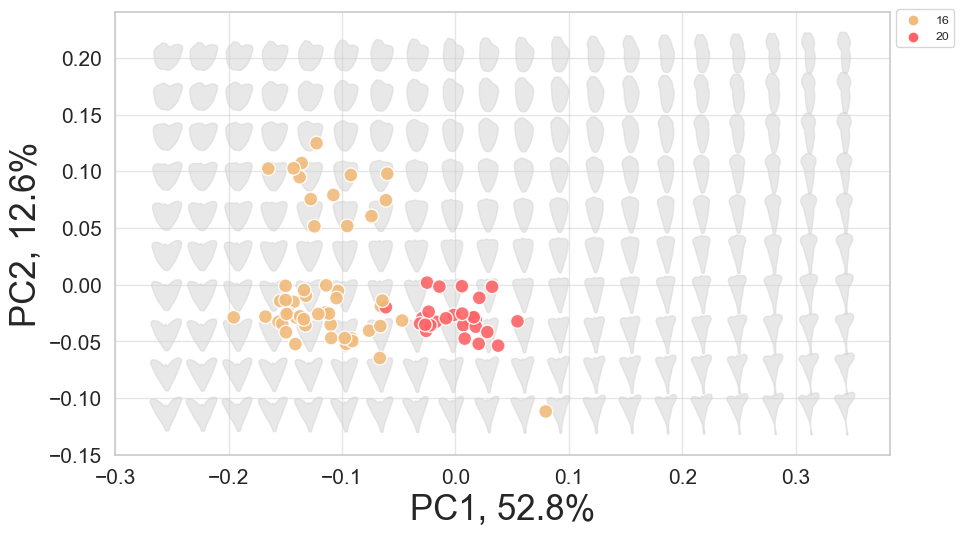

In [85]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 20 # set number of PC1 intervals
numPC2 = 10 # set number of PC2 intervals
hue = "dataset" # select the factor to color by
s = 0.12 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 0.50 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 0.90 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.set_style("whitegrid")
sns.scatterplot(data=g7, x="PC1", y="PC2", hue=hue, s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha, 
               palette = wes_pal)

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('morphospace_dataset_G7_111325.png', dpi= 300, bbox_inches='tight')

In [86]:
g14 = mdata2[mdata2['genotype']== "14.2"]
len(g14)

129

/var/folders/vs/v7f_krn941bb0m5f8qq1kqnh0000gn/T/ipykernel_31210/3430326822.py:39: UserWarning: The palette list has more values (4) than needed (3), which may not be intended.
  sns.scatterplot(data=g14, x="PC1", y="PC2", hue=hue, s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha,


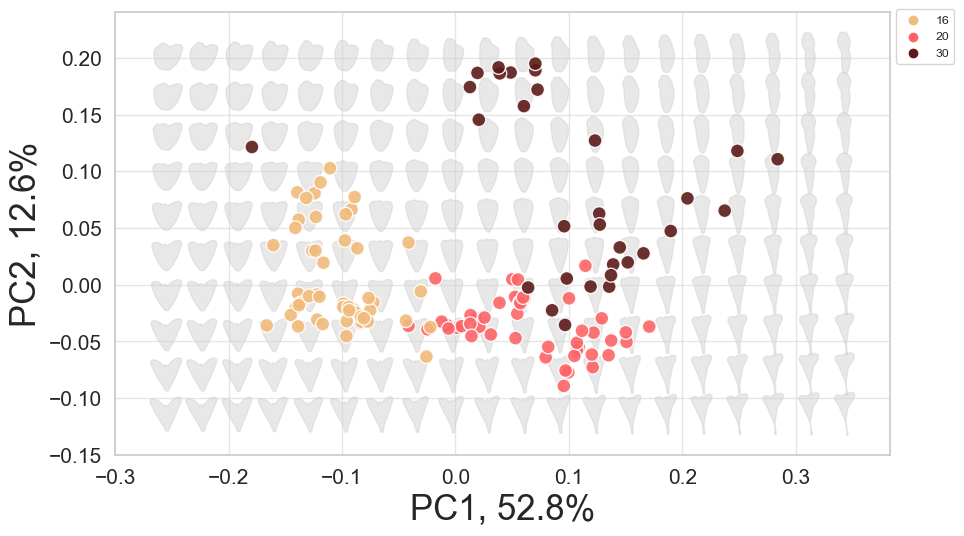

In [87]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 20 # set number of PC1 intervals
numPC2 = 10 # set number of PC2 intervals
hue = "dataset" # select the factor to color by
s = 0.12 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 0.50 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 0.90 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.set_style("whitegrid")
sns.scatterplot(data=g14, x="PC1", y="PC2", hue=hue, s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha, 
               palette = wes_pal)

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('morphospace_dataset_G14_111325.png', dpi= 300, bbox_inches='tight')

In [88]:
g2 = mdata2[mdata2['genotype']== "2.16"]
len(g2)

104

/var/folders/vs/v7f_krn941bb0m5f8qq1kqnh0000gn/T/ipykernel_31210/2835677727.py:39: UserWarning: The palette list has more values (4) than needed (3), which may not be intended.
  sns.scatterplot(data=g2, x="PC1", y="PC2", hue=hue, s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha,


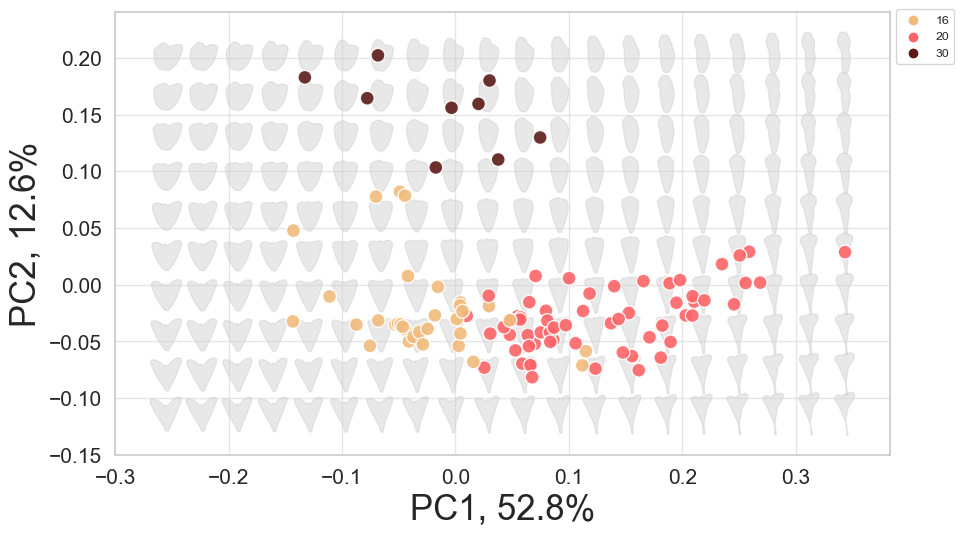

In [89]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 20 # set number of PC1 intervals
numPC2 = 10 # set number of PC2 intervals
hue = "dataset" # select the factor to color by
s = 0.12 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 0.50 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 0.90 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.set_style("whitegrid")
sns.scatterplot(data=g2, x="PC1", y="PC2", hue=hue, s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha, 
               palette = wes_pal)

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('morphospace_dataset_G2_111325.png', dpi= 300, bbox_inches='tight')

## Mean seed weight by dataset 11/24/25

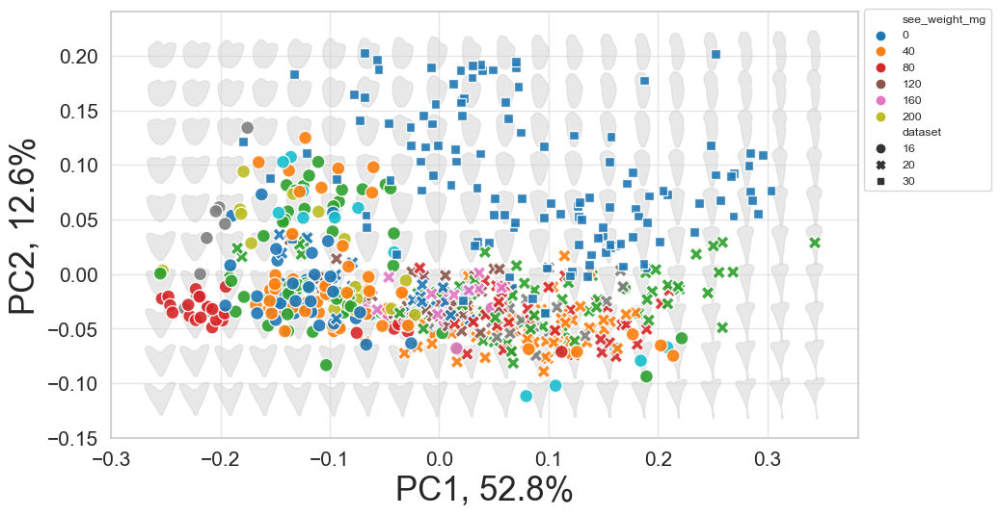

In [90]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 20 # set number of PC1 intervals
numPC2 = 10 # set number of PC2 intervals
hue = "see_weight_mg" # select the factor to color by
s = 0.12 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 0.50 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 0.90 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.set_style("whitegrid")
sns.scatterplot(data=mdata2, x="PC1", y="PC2", hue=hue, style = "dataset", s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha, 
               palette = sns.color_palette("tab10", as_cmap=True))

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('morphospace_seed_weight_111425.png', dpi= 300, bbox_inches='tight')

In [91]:
temp_16 = mdata2[mdata2['dataset']== 16]
len(temp_16)

240

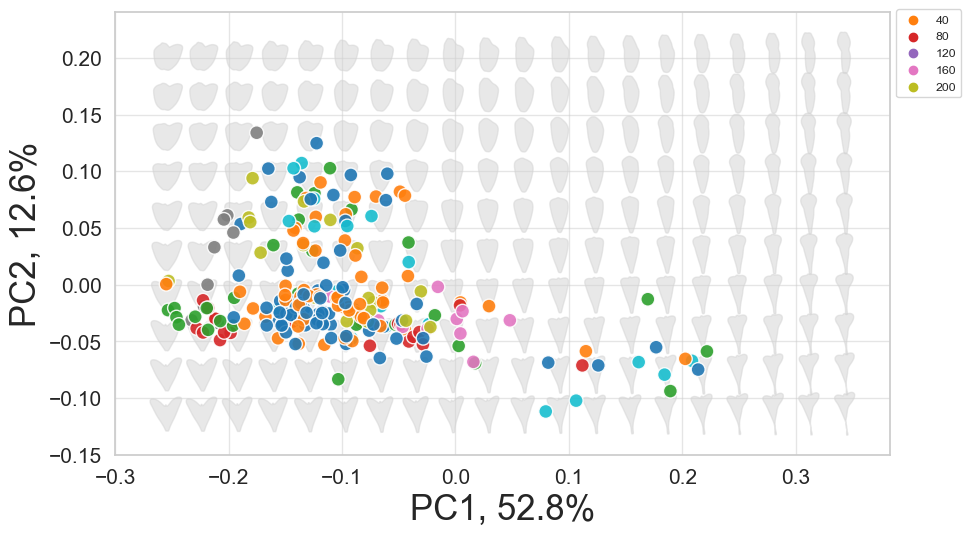

In [92]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 20 # set number of PC1 intervals
numPC2 = 10 # set number of PC2 intervals
hue = "see_weight_mg" # select the factor to color by
s = 0.12 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 0.50 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 0.90 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.set_style("whitegrid")
sns.scatterplot(data=temp_16, x="PC1", y="PC2", hue=hue,s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha, 
               palette = sns.color_palette("tab10", as_cmap=True))

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('morphospace_seed_weight_temp16_111425.png', dpi= 300, bbox_inches='tight')

In [93]:
temp_20 = mdata2[mdata2['dataset']== 20]
len(temp_20)

279

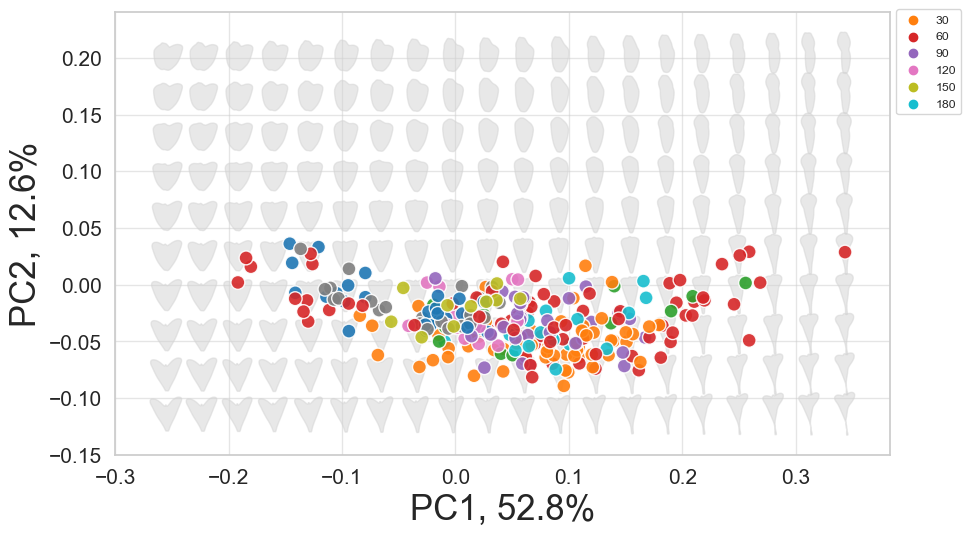

In [94]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 20 # set number of PC1 intervals
numPC2 = 10 # set number of PC2 intervals
hue = "see_weight_mg" # select the factor to color by
s = 0.12 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 0.50 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 0.90 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.set_style("whitegrid")
sns.scatterplot(data=temp_20, x="PC1", y="PC2", hue=hue,s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha, 
               palette = sns.color_palette("tab10", as_cmap=True))

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('morphospace_seed_weight_temp20_111425.png', dpi= 300, bbox_inches='tight')

In [95]:
temp_30 = mdata2[mdata2['dataset']== 30]
len(temp_30)

122

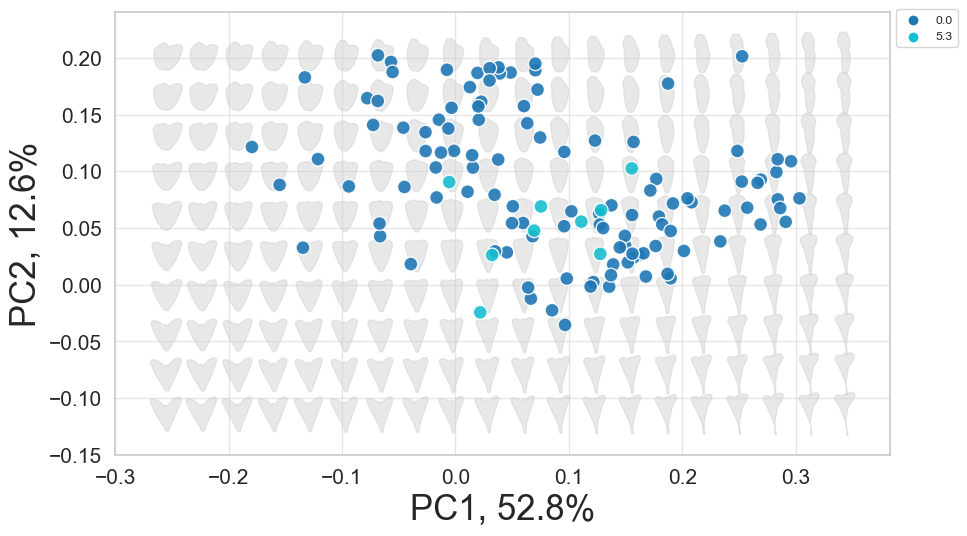

In [96]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 20 # set number of PC1 intervals
numPC2 = 10 # set number of PC2 intervals
hue = "see_weight_mg" # select the factor to color by
s = 0.12 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 0.50 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 0.90 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.set_style("whitegrid")
sns.scatterplot(data=temp_30, x="PC1", y="PC2", hue=hue,s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha, 
               palette = sns.color_palette("tab10", as_cmap=True))

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('morphospace_seed_weight_temp30_111425.png', dpi= 300, bbox_inches='tight')

## Mean Seed Number 11/24/25

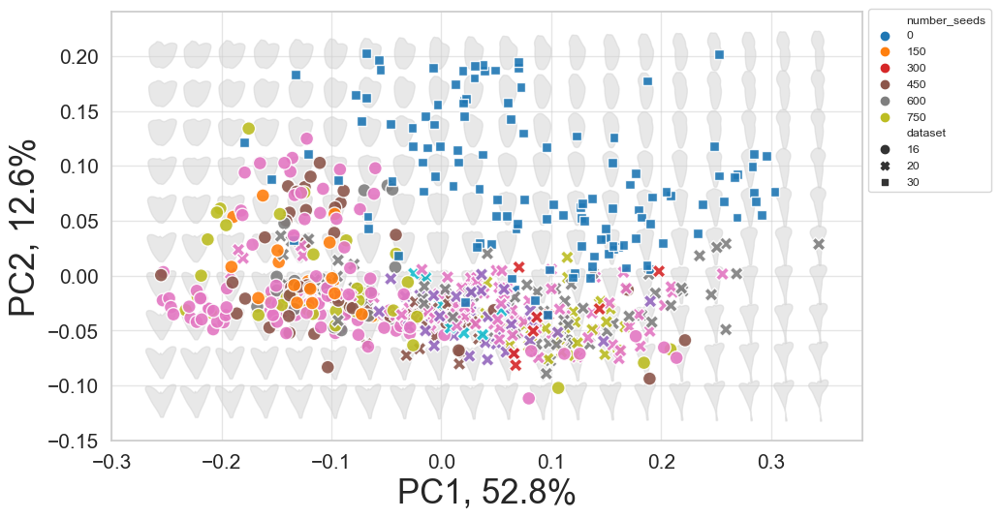

In [97]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 20 # set number of PC1 intervals
numPC2 = 10 # set number of PC2 intervals
hue = "number_seeds" # select the factor to color by
s = 0.12 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 0.50 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 0.90 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.set_style("whitegrid")
sns.scatterplot(data=mdata2, x="PC1", y="PC2", hue=hue, style = "dataset", s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha, 
               palette = sns.color_palette("tab10", as_cmap=True))

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('morphospace_seed_number_111425.png', dpi= 300, bbox_inches='tight')

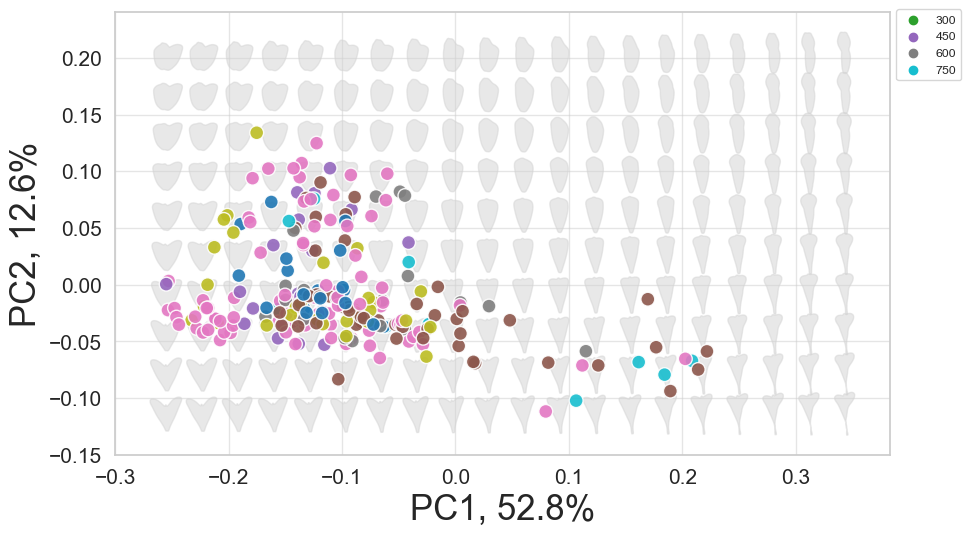

In [98]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 20 # set number of PC1 intervals
numPC2 = 10 # set number of PC2 intervals
hue = "number_seeds" # select the factor to color by
s = 0.12 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 0.50 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 0.90 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.set_style("whitegrid")
sns.scatterplot(data=temp_16, x="PC1", y="PC2", hue=hue,s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha, 
               palette = sns.color_palette("tab10", as_cmap=True))

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('morphospace_seed_number_temp16_111425.png', dpi= 300, bbox_inches='tight')

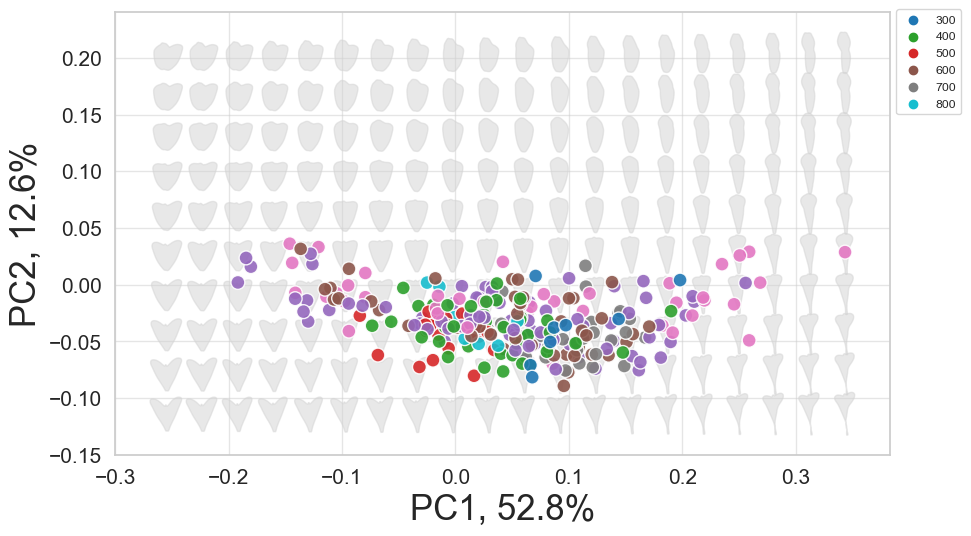

In [99]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 20 # set number of PC1 intervals
numPC2 = 10 # set number of PC2 intervals
hue = "number_seeds" # select the factor to color by
s = 0.12 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 0.50 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 0.90 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.set_style("whitegrid")
sns.scatterplot(data=temp_20, x="PC1", y="PC2", hue=hue, s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha, 
               palette = sns.color_palette("tab10", as_cmap=True))

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('morphospace_seed_number_temp20_111425.png', dpi= 300, bbox_inches='tight')

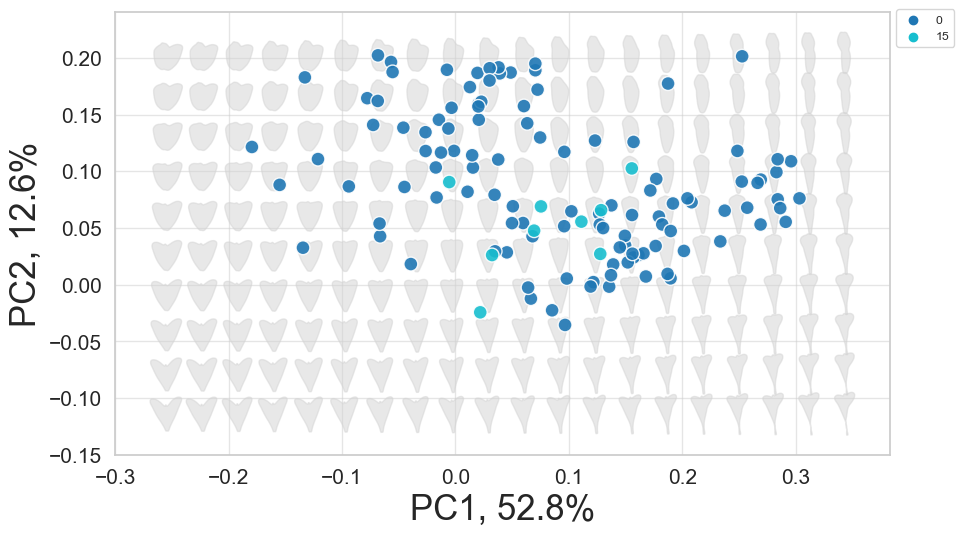

In [100]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 20 # set number of PC1 intervals
numPC2 = 10 # set number of PC2 intervals
hue = "number_seeds" # select the factor to color by
s = 0.12 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 0.50 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 0.90 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.set_style("whitegrid")
sns.scatterplot(data=temp_30, x="PC1", y="PC2", hue=hue,s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha, 
               palette = sns.color_palette("tab10", as_cmap=True))

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('morphospace_seed_number_temp30_111425.png', dpi= 300, bbox_inches='tight')

/var/folders/vs/v7f_krn941bb0m5f8qq1kqnh0000gn/T/ipykernel_31210/2273791110.py:39: UserWarning: 
The palette list has fewer values (5) than needed (6) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(data=mdata, x="PC1", y="PC2", hue=hue, style = "dataset", s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha,


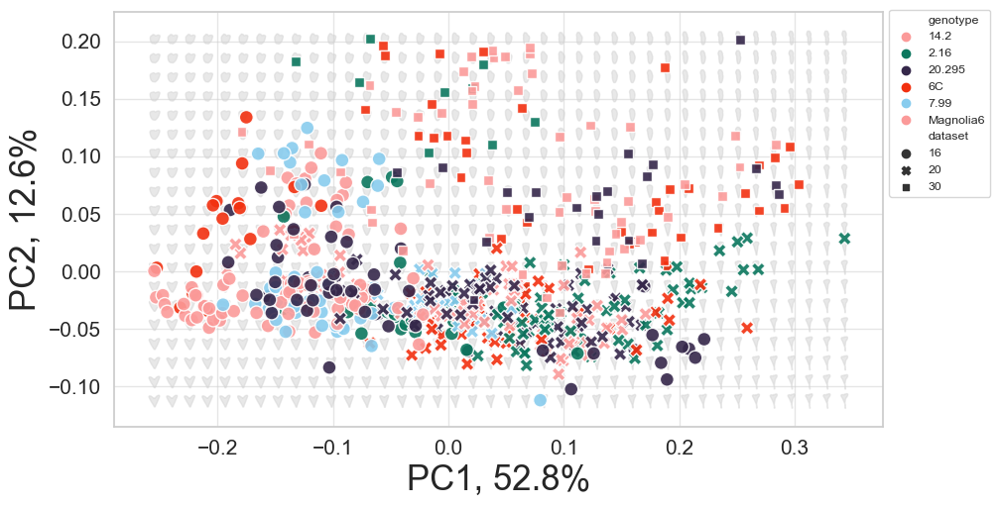

In [101]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 40 # set number of PC1 intervals
numPC2 = 20 # set number of PC2 intervals
hue = "genotype" # select the factor to color by
s = 0.04 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 0.50 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 0.90 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.set_style("whitegrid")
sns.scatterplot(data=mdata, x="PC1", y="PC2", hue=hue, style = "dataset", s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha, 
               palette = custom_palette)

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('morphospace_pca_dataset_genotype_111425.png', dpi= 300, bbox_inches='tight')

In [102]:
g14_df = mdata2[mdata2["genotype"] == "14.2"]
g20_df = mdata2[mdata2["genotype"] == "20.295"]
g6C_df = mdata2[mdata2["genotype"] == "Magnolia6"]
g2_df = mdata2[mdata2["genotype"] == "2.16"]
g7_df = mdata2[mdata2["genotype"] == "7.99"]

In [103]:
pal_14 = ["#FB9A99"]
pal_20 = ["#0B775E"]
pal_6c = ["#35274A"]
pal_2 = ["#F2300F"]
pal_7 = ["#88CCEE"]

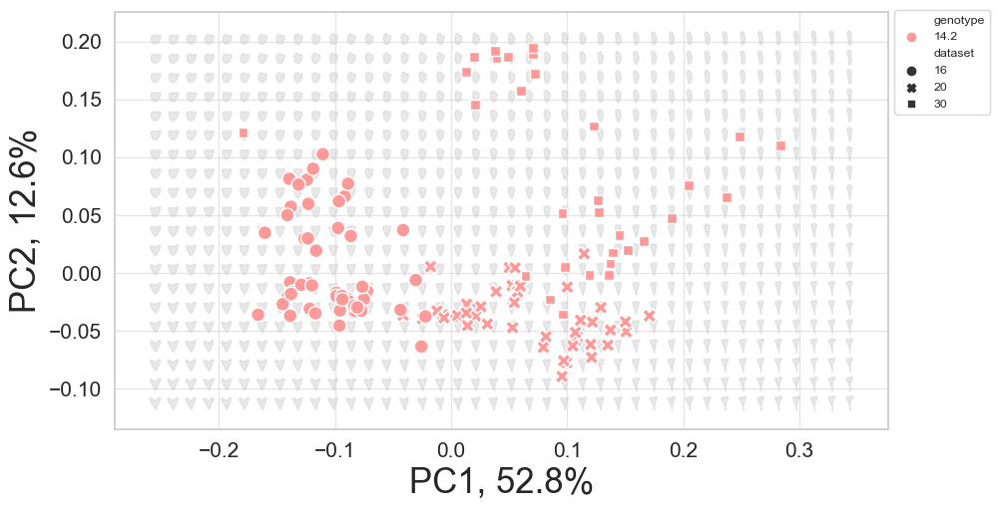

In [104]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 40 # set number of PC1 intervals
numPC2 = 20 # set number of PC2 intervals
hue = "genotype" # select the factor to color by
s = 0.04 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 0.50 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 1 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.set_style("whitegrid")
sns.scatterplot(data=g14_df, x="PC1", y="PC2", hue=hue, style = "dataset", s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha, 
               palette = pal_14)

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('morphospace_14.2_111425.png', dpi= 300, bbox_inches='tight')

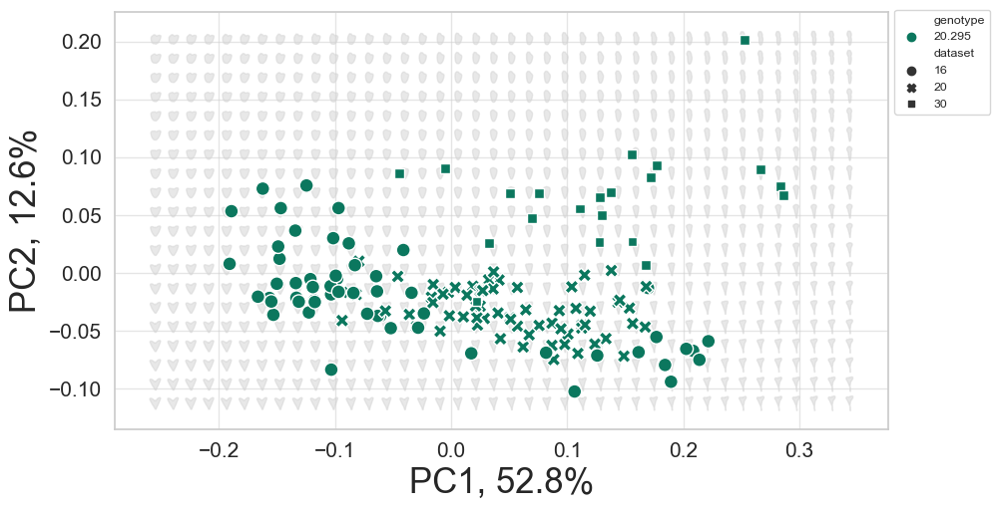

In [105]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 40 # set number of PC1 intervals
numPC2 = 20 # set number of PC2 intervals
hue = "genotype" # select the factor to color by
s = 0.04 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 0.50 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 1 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.set_style("whitegrid")
sns.scatterplot(data=g20_df, x="PC1", y="PC2", hue=hue, style = "dataset", s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha, 
               palette = pal_20)

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('morphospace_20.295_111425.png', dpi= 300, bbox_inches='tight')

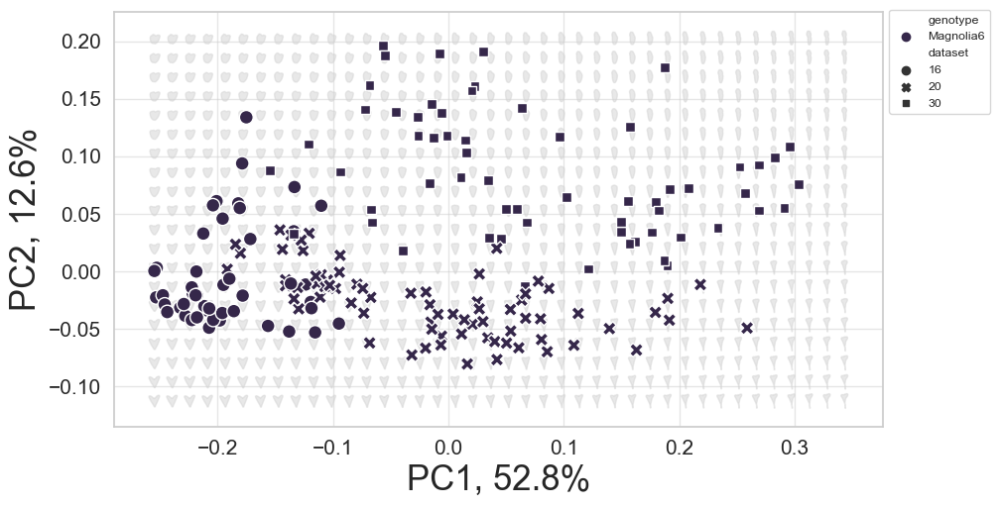

In [106]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 40 # set number of PC1 intervals
numPC2 = 20 # set number of PC2 intervals
hue = "genotype" # select the factor to color by
s = 0.04 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 0.50 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 1 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.set_style("whitegrid")
sns.scatterplot(data=g6C_df, x="PC1", y="PC2", hue=hue, style = "dataset", s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha, 
               palette = pal_6c)

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('morphospace_6C_111425.png', dpi= 300, bbox_inches='tight')

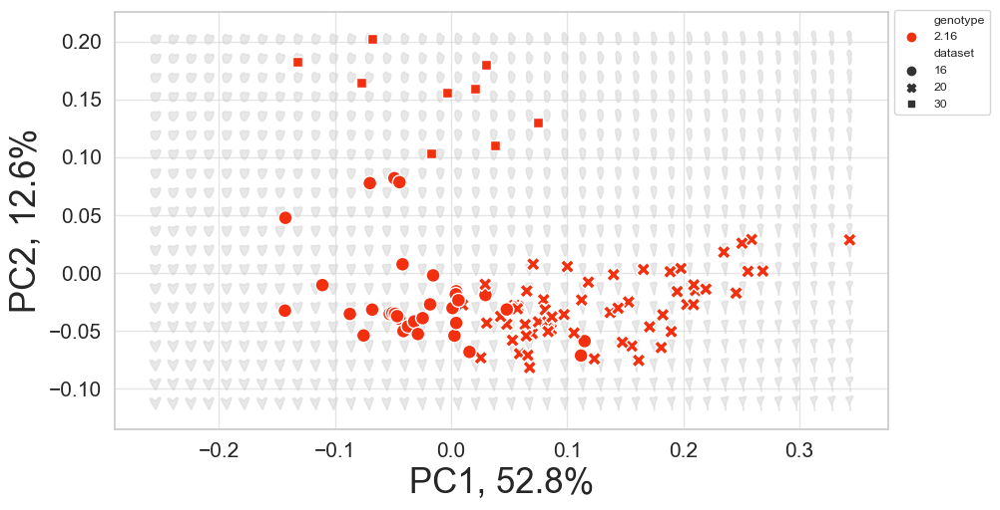

In [107]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 40 # set number of PC1 intervals
numPC2 = 20 # set number of PC2 intervals
hue = "genotype" # select the factor to color by
s = 0.04 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 0.50 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 1 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.set_style("whitegrid")
sns.scatterplot(data=g2_df, x="PC1", y="PC2", hue=hue, style = "dataset", s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha, 
               palette = pal_2)

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('morphospace_2.16_111425.png', dpi= 300, bbox_inches='tight')

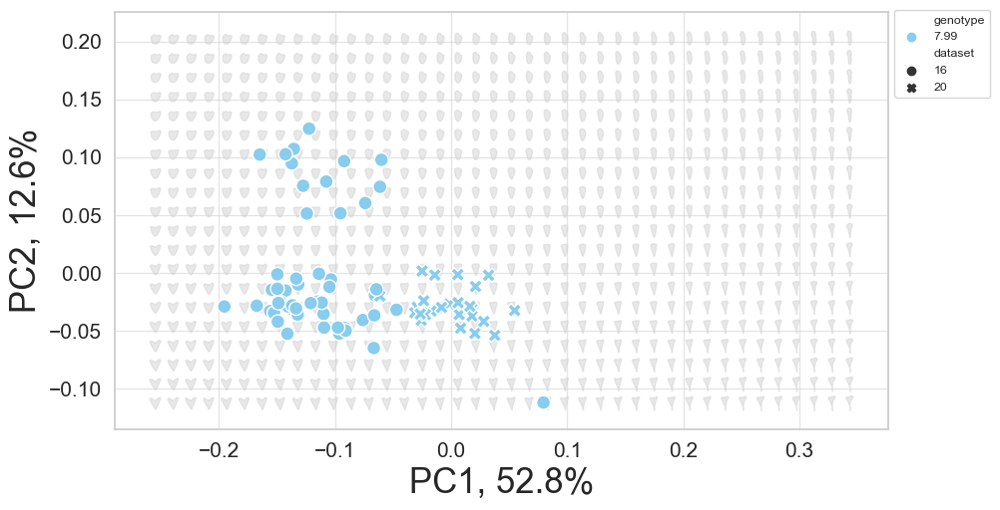

In [108]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 40 # set number of PC1 intervals
numPC2 = 20 # set number of PC2 intervals
hue = "genotype" # select the factor to color by
s = 0.04 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 0.50 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 1 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.set_style("whitegrid")
sns.scatterplot(data=g7_df, x="PC1", y="PC2", hue=hue, style = "dataset", s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha, 
               palette = pal_7)

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('morphospace_7.99_111425.png', dpi= 300, bbox_inches='tight')

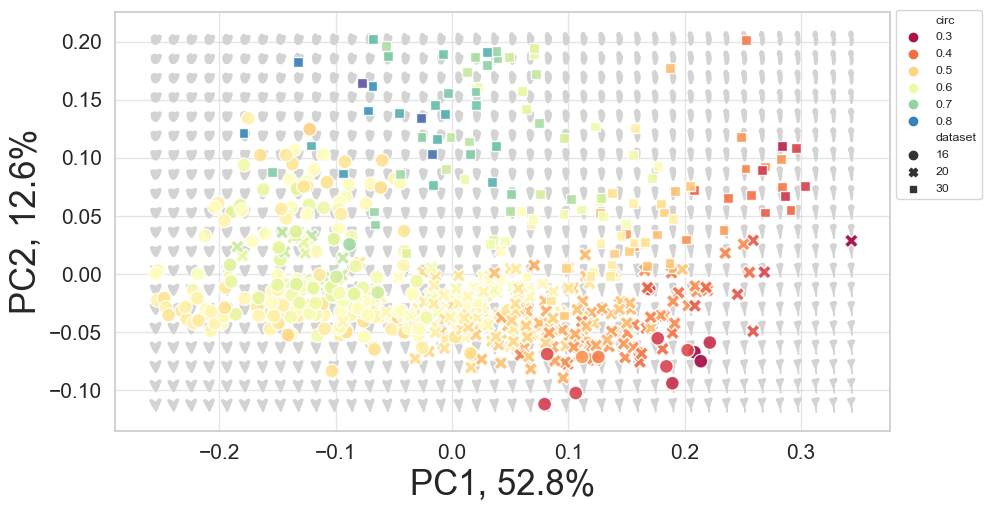

In [109]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 40 # set number of PC1 intervals
numPC2 = 20 # set number of PC2 intervals
hue = "circ" # select the factor to color by
s = 0.04 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 1 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 0.90 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.scatterplot(data=mdata, x="PC1", y="PC2", hue=hue, style = 'dataset', s=pt_size, linewidth=pt_linewidth, 
                alpha=pt_alpha, palette = sns.color_palette("Spectral", as_cmap=True))

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
#plt.text(0.3, 0.28, "rho = 0.67736", horizontalalignment='left', size='medium', color='black')
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('circ_dataset_111425.png', dpi= 300, bbox_inches='tight')

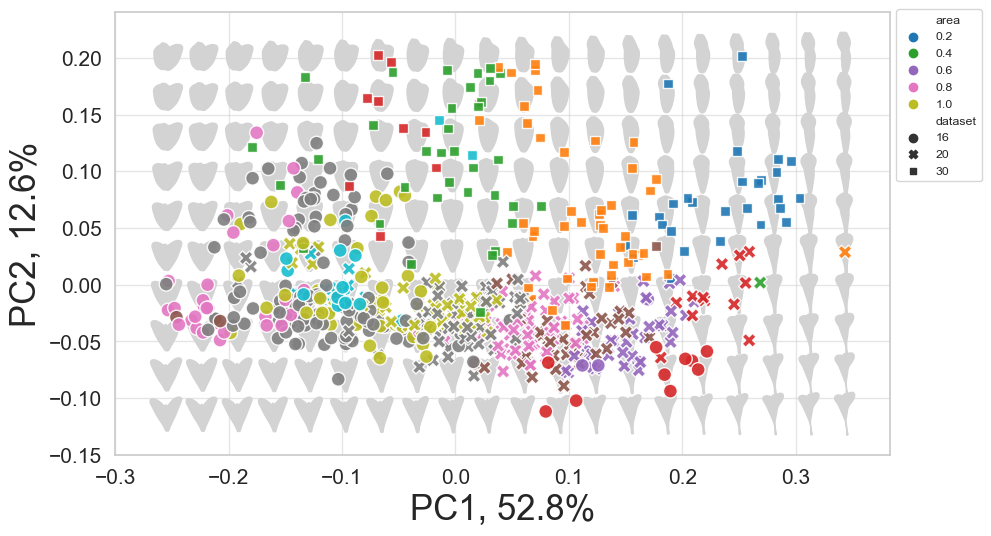

In [110]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 20 # set number of PC1 intervals
numPC2 = 10 # set number of PC2 intervals
hue = "area" # select the factor to color by
s = 0.12 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 1 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 0.90 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.scatterplot(data=mdata, x="PC1", y="PC2", hue=hue, style = 'dataset', s=pt_size, linewidth=pt_linewidth, 
                alpha=pt_alpha, palette = sns.color_palette("tab10", as_cmap=True))

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
#plt.text(0.3, 0.28, "rho = 0.67736", horizontalalignment='left', size='medium', color='black')
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('area_dataset_111425.png', dpi= 300, bbox_inches='tight')

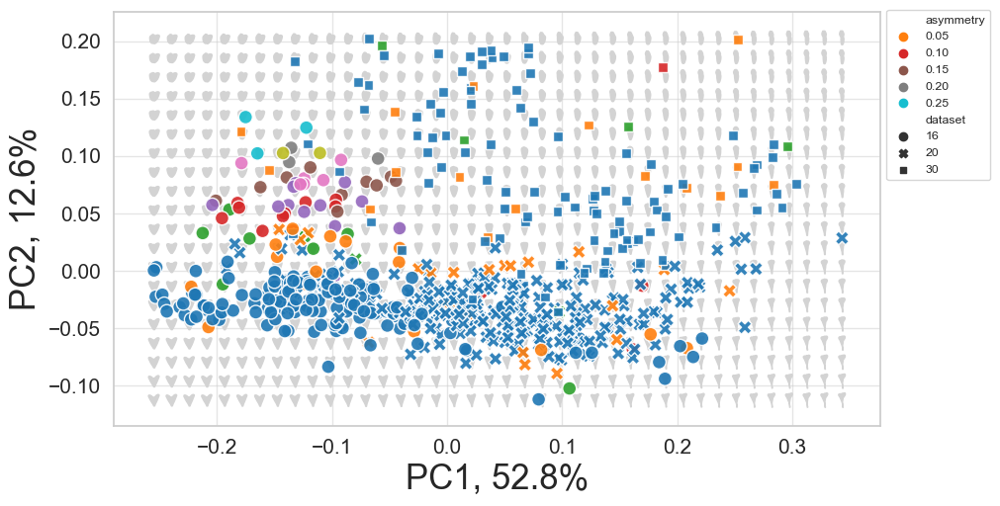

In [111]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 40 # set number of PC1 intervals
numPC2 = 20 # set number of PC2 intervals
hue = "asymmetry" # select the factor to color by
s = 0.04 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 1 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 0.90 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.scatterplot(data=mdata2, x="PC1", y="PC2", hue=hue, style = 'dataset', s=pt_size, linewidth=pt_linewidth, 
                alpha=pt_alpha, palette = sns.color_palette("tab10", as_cmap=True))

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
#plt.text(0.3, 0.28, "rho = 0.67736", horizontalalignment='left', size='medium', color='black')
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('asymmetry_dataset_111425.png', dpi= 300, bbox_inches='tight')

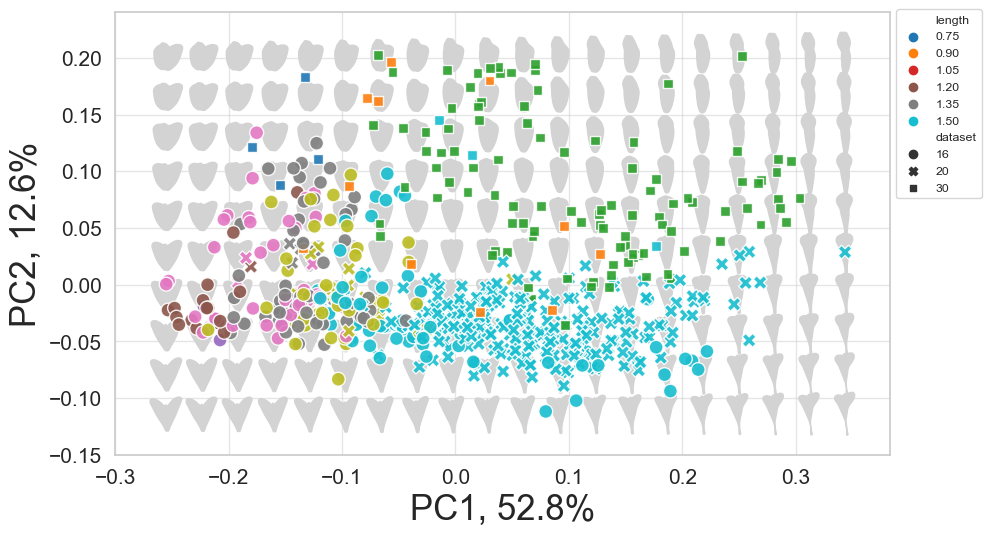

In [112]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 20 # set number of PC1 intervals
numPC2 = 10 # set number of PC2 intervals
hue = "length" # select the factor to color by
s = 0.12 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 1 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 0.90 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.scatterplot(data=mdata, x="PC1", y="PC2", hue=hue, style = 'dataset', s=pt_size, linewidth=pt_linewidth, 
                alpha=pt_alpha, palette = sns.color_palette("tab10", as_cmap=True))

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
#plt.text(0.3, 0.28, "rho = 0.67736", horizontalalignment='left', size='medium', color='black')
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('length_dataset_111425.png', dpi= 300, bbox_inches='tight')

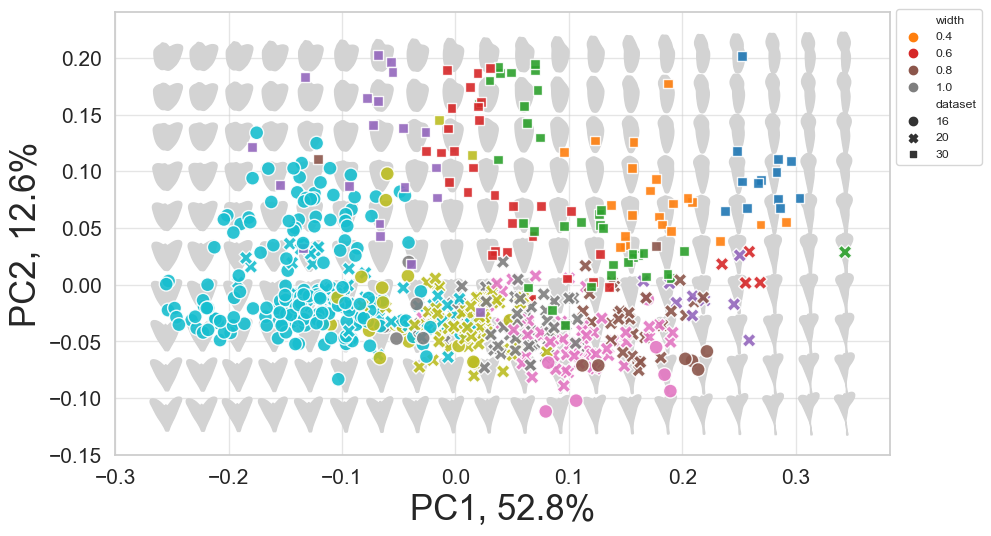

In [113]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 20 # set number of PC1 intervals
numPC2 = 10 # set number of PC2 intervals
hue = "width" # select the factor to color by
s = 0.12 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 1 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 0.90 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.scatterplot(data=mdata, x="PC1", y="PC2", hue=hue, style = 'dataset', s=pt_size, linewidth=pt_linewidth, 
                alpha=pt_alpha, palette = sns.color_palette("tab10", as_cmap=True))

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
#plt.text(0.3, 0.28, "rho = 0.67736", horizontalalignment='left', size='medium', color='black')
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('width_dataset_111425.png', dpi= 300, bbox_inches='tight')

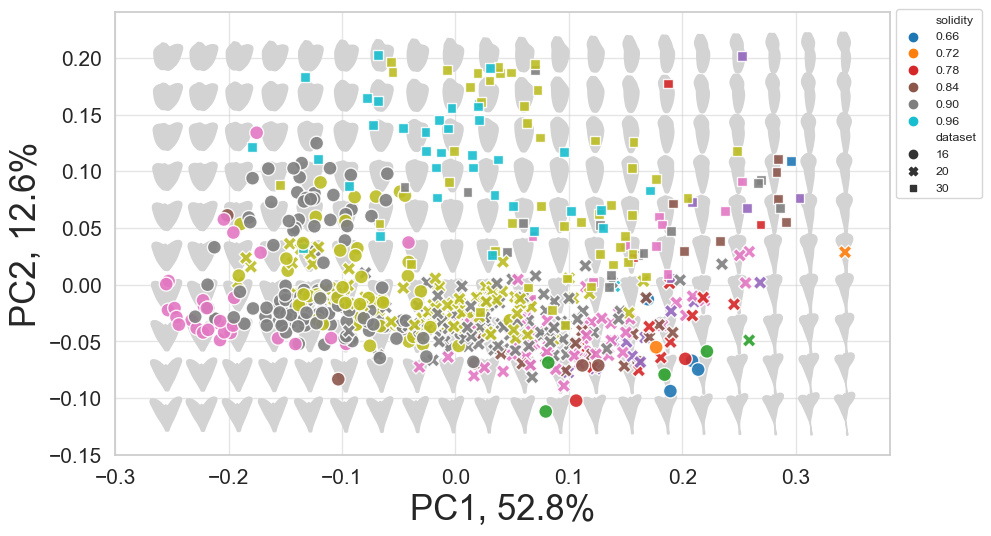

In [114]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 20 # set number of PC1 intervals
numPC2 = 10 # set number of PC2 intervals
hue = "solidity" # select the factor to color by
s = 0.12 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 1 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 0.90 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.scatterplot(data=mdata2, x="PC1", y="PC2", hue=hue, style = 'dataset', s=pt_size, linewidth=pt_linewidth, 
                alpha=pt_alpha, palette = sns.color_palette("tab10", as_cmap=True))

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
#plt.text(0.3, 0.28, "rho = 0.67736", horizontalalignment='left', size='medium', color='black')
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('solidity_dataset_111425.png', dpi= 300, bbox_inches='tight')

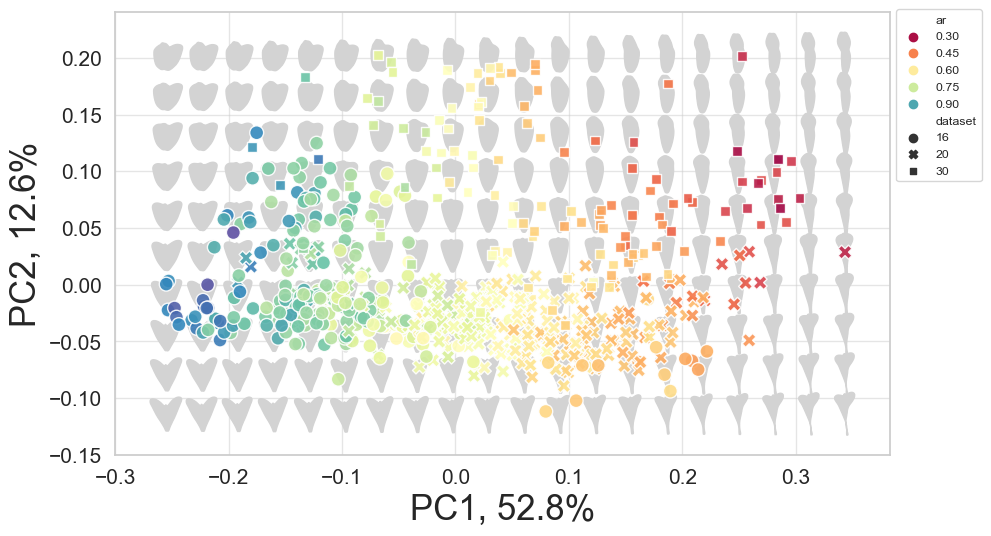

In [115]:
plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 20 # set number of PC1 intervals
numPC2 = 10 # set number of PC2 intervals
hue = "ar" # select the factor to color by
s = 0.12 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 1 # alpha of inverse eigenleaf
pt_size = 100 # size of data points
pt_linewidth = 1 # lw of data points, set to 0 for no edges
pt_alpha = 0.90 # alpha of the data points
ax_label_fs = 25 # font size of the x and y axis titles
ax_tick_fs = 15 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace colored by species" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.scatterplot(data=mdata2, x="PC1", y="PC2", hue=hue, style = 'dataset', s=pt_size, linewidth=pt_linewidth, 
                alpha=pt_alpha, palette = sns.color_palette("Spectral", as_cmap=True))

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
#plt.text(0.3, 0.28, "rho = 0.67736", horizontalalignment='left', size='medium', color='black')
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.grid(alpha=grid_alpha)
plt.gca().set_axisbelow(True)


plt.savefig('aspect_ratio_dataset_111425.png', dpi= 300, bbox_inches='tight')

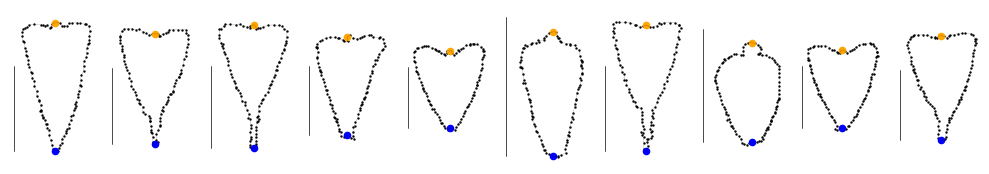

In [76]:
# Plot random leaves and check that it is working

plt.figure(figsize=(10,10)) # set figure size

rand_indices = np.random.randint(0,len(cm_arr),10) # generate random indices of leaves

plot_num = 1 # plot counter number

for i in rand_indices:
    
    plt.subplot(1,10,plot_num) # subplot number
    
    plt.plot(cm_arr[i,:,0], cm_arr[i,:,1], c="k", lw=0.1) # outline
    plt.plot([min(cm_arr[i,:,0])-0.1,min(cm_arr[i,:,0])-0.1],
            [cm_arr[i,0,1], cm_arr[i,0,1]+1], c="k", lw=0.5) # cm scale
    plt.scatter(cm_arr[i,:,0], cm_arr[i,:,1], c="k", s=0.5) # points
    plt.scatter(cm_arr[i,0,0], cm_arr[i,0,1], c = "blue", s=20) # base
    plt.scatter(cm_arr[i,res-1,0], cm_arr[i,res-1,1], c= "orange", s=20) # tip
    
    #plt.title(mdata["genotype"][i], fontsize=13)
    
    plt.gca().set_aspect("equal")
    plt.axis("off")
    
    plot_num += 1
    
#plt.suptitle(str(res*2-1) + " pseudo-landmarks")
plt.tight_layout()
plt.savefig('pseudo_landmarks2_111425.png', dpi= 300, bbox_inches='tight')

The number of falsely predicted: 107
The number of correctly predicted: 534
Out of 641 total samples
model performed a mean accuracy of  0.4530119509043927


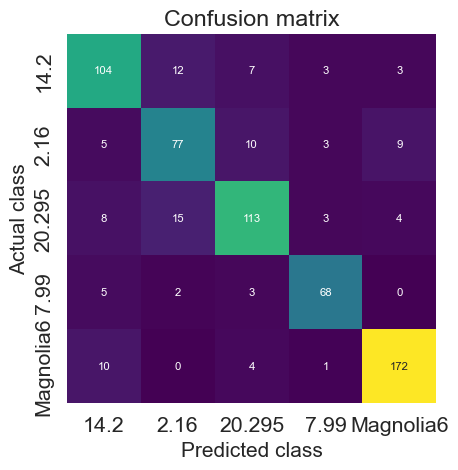

In [117]:
##################################################
### PERFORM LINEAR DISCRIMINANT ANALYSIS (LDA) ###
##################################################

# create a df for LDA by species
species_df = pd.DataFrame(data=flat_arr[:,:])

# add the genotype labels
species_df["genotype"] = mdata2["genotype"]

# create input and output variables
X = species_df.iloc[:,0:((res*2)-1)*2]
y = species_df["genotype"]

# fit the LDA model
species_model = LinearDiscriminantAnalysis()
species_model.fit(X,y)

# retrieve LDA scalings and coefficients
species_scalings = species_model.scalings_
species_coefs = species_model.coef_

# perform prediction
species_prediction= species_model.predict(X)
comparison_result = [X == y for X, y in zip(y, species_prediction)]

# print out number of correctly predicted results
count_true_pl = comparison_result.count(True)
count_false_pl = comparison_result.count(False)
print("The number of falsely predicted:", count_false_pl)
print("The number of correctly predicted:", count_true_pl)
print("Out of " + str(len(comparison_result)) + " total samples" )

# Create confusion matrix
true_species_values = mdata2["genotype"]
predicted_species_values = species_prediction

classes = sorted(mdata2["genotype"].unique())

cm_species = confusion_matrix(true_species_values, predicted_species_values, labels=classes)


## Define method to evaluate model
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=42)

#evaluate model
scores = cross_val_score(species_model, X, y, scoring='accuracy', cv=cv, n_jobs=-1)
print("model performed a mean accuracy of ", np.mean(scores))   

# First subplot: confusion matrix
sns.set(font_scale=1.4)
ax1 = sns.heatmap(cm_species, annot=True, annot_kws={"fontsize":8.2}, fmt="d", cmap="viridis", square=True, cbar=False, xticklabels=classes, yticklabels=classes)
ax1 = plt.title("Confusion matrix")
ax1 = plt.xlabel("Predicted class", fontsize=15)
ax1 = plt.ylabel("Actual class", fontsize=15)

#sns.move_legend(ax1, "upper left", bbox_to_anchor=(1, 1), fontsize = 8.5)

plt.savefig('lda_genotype_confusion_total_111425.png', dpi= 300, bbox_inches='tight')

The number of falsely predicted: 106
The number of correctly predicted: 535
Out of 641 total samples
model performed a mean accuracy of  0.40460675064599483


/var/folders/vs/v7f_krn941bb0m5f8qq1kqnh0000gn/T/ipykernel_31210/493185400.py:64: UserWarning: 
The palette list has fewer values (5) than needed (6) and will cycle, which may produce an uninterpretable plot.
  ax2 = sns.scatterplot(data=species_plot_df, x="LD1", y = 'LD2', hue="genotype", palette = custom_palette)


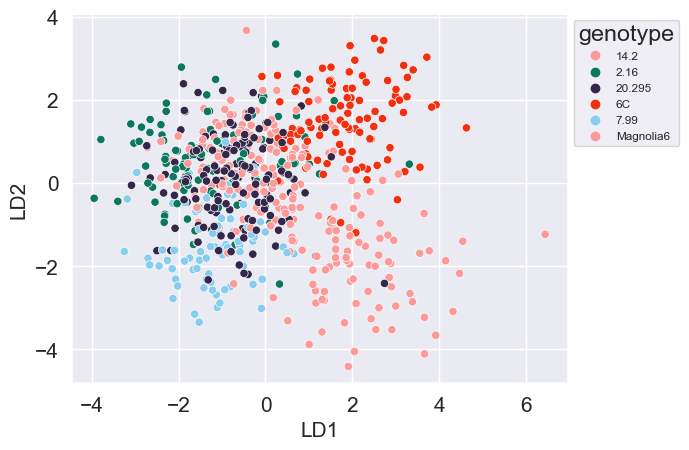

In [119]:
##################################################
### PERFORM LINEAR DISCRIMINANT ANALYSIS (LDA) ###
##################################################

# create a df for LDA by species
species_df = pd.DataFrame(data=flat_arr[:,:])

# add the genotype labels
species_df["genotype"] = mdata["genotype"]

# create input and output variables
X = species_df.iloc[:,0:((res*2)-1)*2]
y = species_df["genotype"]

# fit the LDA model
species_model = LinearDiscriminantAnalysis()
species_model.fit(X,y)

# retrieve LDA scalings and coefficients
species_scalings = species_model.scalings_
species_coefs = species_model.coef_

# perform prediction
species_prediction= species_model.predict(X)
comparison_result = [X == y for X, y in zip(y, species_prediction)]

# print out number of correctly predicted results
count_true_pl = comparison_result.count(True)
count_false_pl = comparison_result.count(False)
print("The number of falsely predicted:", count_false_pl)
print("The number of correctly predicted:", count_true_pl)
print("Out of " + str(len(comparison_result)) + " total samples" )

# Create confusion matrix
true_species_values = mdata["genotype"]
predicted_species_values = species_prediction

cm_species = confusion_matrix(true_species_values, predicted_species_values)

classes = mdata["genotype"].unique()

## Define method to evaluate model
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=42)

#evaluate model
scores = cross_val_score(species_model, X, y, scoring='accuracy', cv=cv, n_jobs=-1)
print("model performed a mean accuracy of ", np.mean(scores))   

# First subplot: confusion matrix
#sns.set(font_scale=1.4)
#ax1 = plt.subplot(1,2,1)
#ax1 = sns.heatmap(cm_species/np.sum(cm_species), annot=True, annot_kws={"fontsize":10}, fmt=".2%", cmap="viridis", square=True, cbar=False, xticklabels=classes, yticklabels=classes)
#ax1 = plt.title("Confusion matrix")
#ax1 = plt.xlabel("Predicted class", fontsize=15)
#ax1 = plt.ylabel("Actual class", fontsize=15)

# Second subplot: plot of linear discriminant scores
#plt.subplot(1,2,2)
data_plot = species_model.fit(X, y).transform(X)
species_plot_df = pd.DataFrame(data=data_plot[:,:])
species_plot_df["genotype"] = mdata["genotype"]
# NOTE: COLUMN NAMES ARE MANUALLY RENAMED
species_plot_df = species_plot_df.rename(columns={0:'LD1', 1:'LD2'})
ax2 = sns.scatterplot(data=species_plot_df, x="LD1", y = 'LD2', hue="genotype", palette = custom_palette)
ax2.tick_params(axis='both', labelsize=15)
ax2.set_xlabel("LD1", fontsize=15)
ax2.set_ylabel("LD2", fontsize=15)

#plt.title("Linear Discriminants")

## note: edit this plot 
#plt.suptitle("LDA by Population")
#plt.tight_layout()
sns.move_legend(ax2, "upper left", bbox_to_anchor=(1, 1), fontsize = 8.5)

plt.savefig('lda_dataset_scatter_confusion_041725.png', dpi= 300, bbox_inches='tight')

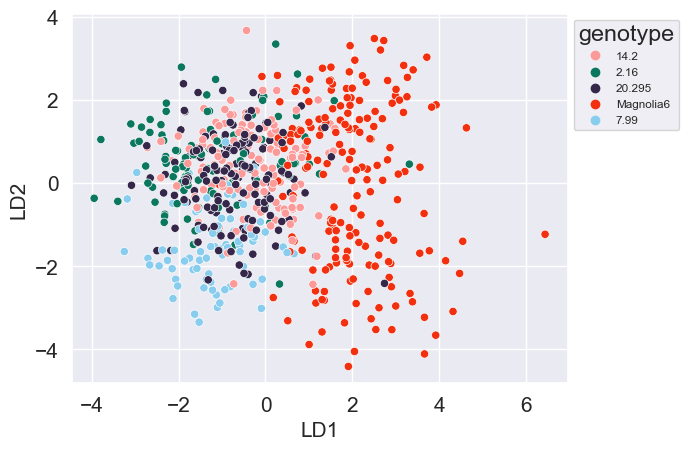

In [120]:
data_plot = species_model.fit(X, y).transform(X)
species_plot_df = pd.DataFrame(data=data_plot[:,:])
species_plot_df["genotype"] = mdata2["genotype"]
# NOTE: COLUMN NAMES ARE MANUALLY RENAMED
species_plot_df = species_plot_df.rename(columns={0:'LD1', 1:'LD2'})
ax2 = sns.scatterplot(data=species_plot_df, x="LD1", y = 'LD2', hue="genotype", palette = custom_palette)
ax2.tick_params(axis='both', labelsize=15)
ax2.set_xlabel("LD1", fontsize=15)
ax2.set_ylabel("LD2", fontsize=15)

#plt.title("Linear Discriminants")

## note: edit this plot 
#plt.suptitle("LDA by Population")
#plt.tight_layout()
sns.move_legend(ax2, "upper left", bbox_to_anchor=(1, 1), fontsize = 8.5)

plt.savefig('lda_dataset_scatter_111425.png', dpi= 300, bbox_inches='tight')

/var/folders/vs/v7f_krn941bb0m5f8qq1kqnh0000gn/T/ipykernel_31210/1108482254.py:6: UserWarning: The palette list has more values (5) than needed (3), which may not be intended.
  ax2 = sns.scatterplot(data=species_plot_df, x="LD1", y = 'LD2', hue="dataset", palette = custom_palette)


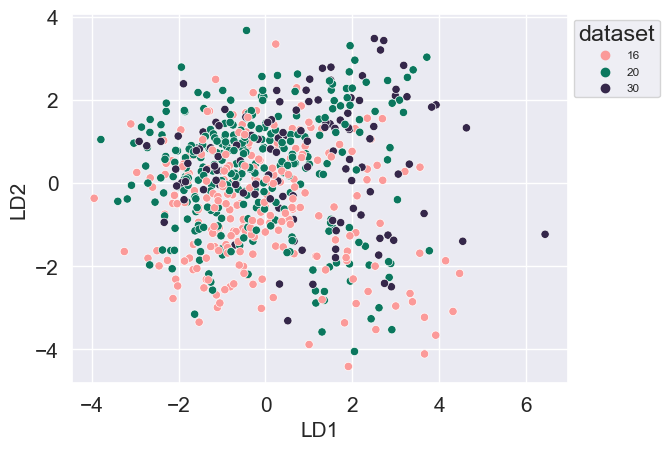

In [121]:
data_plot = species_model.fit(X, y).transform(X)
species_plot_df = pd.DataFrame(data=data_plot[:,:])
species_plot_df["dataset"] = mdata2["dataset"]
# NOTE: COLUMN NAMES ARE MANUALLY RENAMED
species_plot_df = species_plot_df.rename(columns={0:'LD1', 1:'LD2'})
ax2 = sns.scatterplot(data=species_plot_df, x="LD1", y = 'LD2', hue="dataset", palette = custom_palette)
ax2.tick_params(axis='both', labelsize=15)
ax2.set_xlabel("LD1", fontsize=15)
ax2.set_ylabel("LD2", fontsize=15)

#plt.title("Linear Discriminants")

## note: edit this plot 
#plt.suptitle("LDA by Population")
#plt.tight_layout()
sns.move_legend(ax2, "upper left", bbox_to_anchor=(1, 1), fontsize = 8.5)

plt.savefig('lda_dataset_scatter_dataset_111425.png', dpi= 300, bbox_inches='tight')

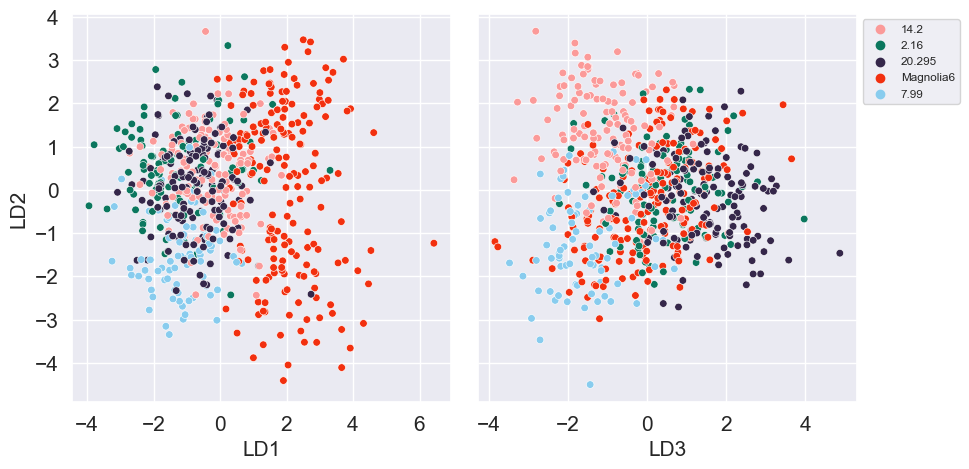

In [122]:
data_plot = species_model.fit(X, y).transform(X)
species_plot_df = pd.DataFrame(data=data_plot[:,:])
species_plot_df["genotype"] = mdata2["genotype"]

species_plot_df = species_plot_df.rename(columns={0:'LD1', 1:'LD2', 2:"LD3", 3:"LD4", 4:"LD5", 5:"LD6"})

fig, (ax4, ax5) = plt.subplots(ncols=2, sharey=True, figsize=(10,5))

sns.scatterplot(data=species_plot_df, x="LD1", y="LD2", hue="genotype", s=30, ax=ax4, palette = custom_palette)
ax4.tick_params(axis='both', labelsize=15)
ax4.set_xlabel("LD1", fontsize=15)
ax4.set_ylabel("LD2", fontsize=15)
ax4.get_legend().remove()
sns.scatterplot(data=species_plot_df, x="LD3", y="LD4", hue="genotype", s=30, ax=ax5, palette = custom_palette)
ax5.tick_params(axis='both', labelsize=15)
ax5.set_xlabel("LD3", fontsize=15)
ax5.set_ylabel("LD4", fontsize=15)
ax5.get_legend().remove()
plt.legend(loc="upper left", bbox_to_anchor=(1, 1), fontsize = 8.5)


plt.tight_layout()
plt.savefig('lda_panels_111425.png', dpi= 300, bbox_inches='tight')

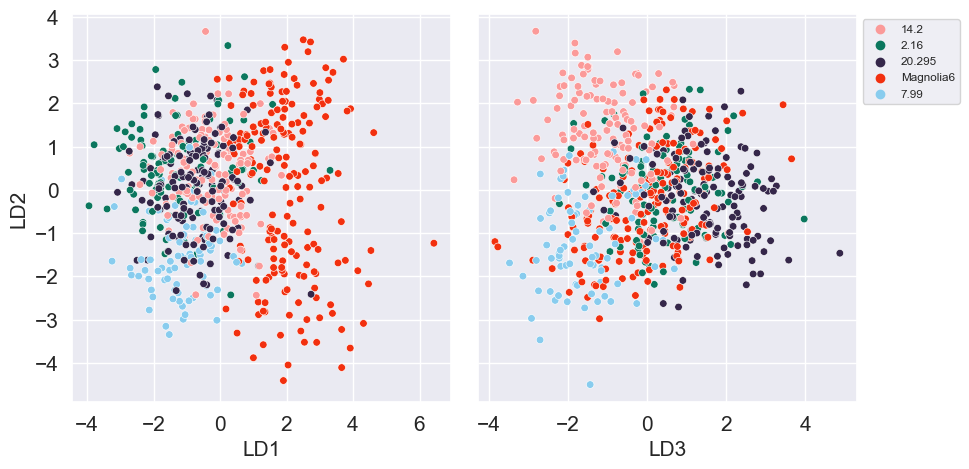

In [123]:
data_plot = species_model.fit(X, y).transform(X)
species_plot_df = pd.DataFrame(data=data_plot[:,:])
species_plot_df["genotype"] = mdata2["genotype"]

species_plot_df = species_plot_df.rename(columns={0:'LD1', 1:'LD2', 2:"LD3", 3:"LD4", 4:"LD5", 5:"LD6"})

fig, (ax4, ax5) = plt.subplots(ncols=2, sharey=True, figsize=(10,5))

sns.scatterplot(data=species_plot_df, x="LD1", y="LD2", hue="genotype", s=30, ax=ax4, palette = custom_palette)
ax4.tick_params(axis='both', labelsize=15)
ax4.set_xlabel("LD1", fontsize=15)
ax4.set_ylabel("LD2", fontsize=15)
ax4.get_legend().remove()
sns.scatterplot(data=species_plot_df, x="LD3", y="LD4", hue="genotype", s=30, ax=ax5, palette = custom_palette)
ax5.tick_params(axis='both', labelsize=15)
ax5.set_xlabel("LD3", fontsize=15)
ax5.set_ylabel("LD4", fontsize=15)
ax5.get_legend().remove()
plt.legend(loc="upper left", bbox_to_anchor=(1, 1), fontsize = 8.5)


plt.tight_layout()
plt.savefig('lda_panels_dataset_111425.png', dpi= 300, bbox_inches='tight')

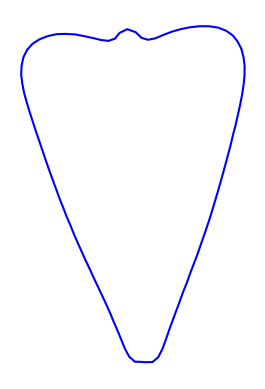

In [124]:
plt.plot(mean_shape[:,0], mean_shape[:,1], c = "blue")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('mean_fruit2_111425.png', dpi= 300, bbox_inches='tight')

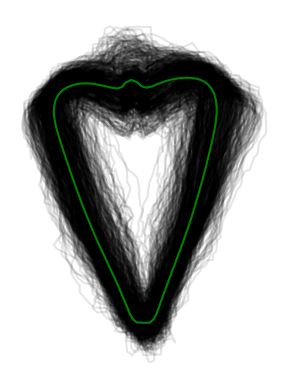

In [125]:
plot_col = "black" # set plot color
a = 0.10 # set alpha
for i in range(np.shape(proc_arr)[0]):
    
    curr_leaf = proc_arr[i,:,:]
    
    plt.plot(curr_leaf[:,0], curr_leaf[:,1], c=plot_col, alpha=a) # plot current leaf with color and alpha
    plt.gca().set_aspect("equal")
    
plt.plot(mean_shape[:,0], mean_shape[:,1], c = "green") # plot the mean leaf

plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('mean_fruit_overlay2_111425.png', dpi= 300, bbox_inches='tight')

## Mean Shapes

In [7]:
g20 = pd.read_csv("g20.csv")
g2 = pd.read_csv("g2.csv")
g14 = pd.read_csv("g14.csv")
g7 = pd.read_csv("g7.csv")
gM6 = pd.read_csv("gM6.csv")

In [137]:
t16 = pd.read_csv("t16.csv")
print("t16", len(t16))
t20 = pd.read_csv("t20.csv")
print("t20", len(t20))
t30 = pd.read_csv("t30.csv")
print("t30", len(t30))

g20_c16 = pd.read_csv("g20_c16.csv")
print("g20_c16", len(g20_c16))
g20_c20 = pd.read_csv("g20_c20.csv")
print("g20_c20", len(g20_c20))
g20_c30 = pd.read_csv("g20_c30.csv")
print("g20_c30", len(g20_c30))

g2_c16 = pd.read_csv("g2_c16.csv")
print("g2_c16", len(g2_c16))
g2_c20 = pd.read_csv("g2_c20.csv")
print("g2_c20", len(g2_c20))
g2_c30 = pd.read_csv("g2_c30.csv")
print("g2_c30", len(g2_c30))

g7_c16 = pd.read_csv("g7_c16.csv")
print("g7_c16", len(g7_c16))
g7_c20 = pd.read_csv("g7_c20.csv")
print("g7_c20", len(g7_c20))

gM6_c16 = pd.read_csv("gM6_c16.csv")
print("gM6_c16", len(gM6_c16))
gM6_c20 = pd.read_csv("gM6_c20.csv")
print("gM6_c20", len(gM6_c20))
gM6_c30 = pd.read_csv("gM6_c30.csv")
print("gM6_c30", len(gM6_c30))

g14_c16 = pd.read_csv("g14_c16.csv")
print("g14_c16", len(g14_c16))
g14_c20 = pd.read_csv("g14_c20.csv")
print("g14_c20", len(g14_c20))
g14_c30 = pd.read_csv("g14_c30.csv")
print("g14_c30", len(g14_c30))

t16 240
t20 279
t30 122
g20_c16 55
g20_c20 67
g20_c30 21
g2_c16 34
g2_c20 61
g2_c30 9
g7_c16 51
g7_c20 27
gM6_c16 50
gM6_c20 76
gM6_c30 61
g14_c16 50
g14_c20 48
g14_c30 31


In [10]:
g20_arr = process_leaf_data(g20)
g2_arr = process_leaf_data(g2)
g14_arr = process_leaf_data(g14)
g7_arr = process_leaf_data(g7)
gM6_arr = process_leaf_data(gM6)

0 20.295_15_16_set5_rep2_fruit1.jpg
1 20.295_15_16_set5_rep2_fruit10.jpg
2 20.295_15_16_set5_rep2_fruit2.jpg
3 20.295_15_16_set5_rep2_fruit3.jpg
4 20.295_15_16_set5_rep2_fruit4.jpg
5 20.295_15_16_set5_rep2_fruit5.jpg
6 20.295_15_16_set5_rep2_fruit6.jpg
7 20.295_15_16_set5_rep2_fruit7.jpg
8 20.295_15_16_set5_rep2_fruit8.jpg
9 20.295_15_16_set5_rep2_fruit9.jpg
10 20.295_15_16_set5_rep3_fruit1.jpg
11 20.295_15_16_set5_rep3_fruit10.jpg
12 20.295_15_16_set5_rep3_fruit2.jpg
13 20.295_15_16_set5_rep3_fruit3.jpg
14 20.295_15_16_set5_rep3_fruit4.jpg
15 20.295_15_16_set5_rep3_fruit5.jpg
16 20.295_15_16_set5_rep3_fruit6.jpg
17 20.295_15_16_set5_rep3_fruit7.jpg
18 20.295_15_16_set5_rep3_fruit8.jpg
19 20.295_15_16_set5_rep3_fruit9.jpg
20 20295_15_16_set3_rep3_fruit1.jpg
21 20295_15_16_set3_rep3_fruit3.jpg
22 20295_15_16_set3_rep3_fruit4.jpg
23 20295_15_16_set3_rep3_fruit5.jpg
24 20295_15_16_set3_rep3_fruit6.jpg
25 20295_8_20_set4_rep3_fruit1.jpg
26 20295_8_20_set4_rep3_fruit10.jpg
27 20295_8_20_set

90 2.16_15_16_set5_rep3_fruit6.jpg
91 2.16_15_16_set5_rep3_fruit7.jpg
92 2.16_15_16_set5_rep3_fruit8.jpg
93 2.16_15_16_set5_rep3_fruit9.jpg
94 2.16_15_16_set5_rep3_fruit10.jpg
95 2.16_17_30_set5_rep1_fruit1.jpg
96 2.16_17_30_set5_rep1_fruit2.jpg
97 2.16_17_30_set5_rep1_fruit3.jpg
98 2.16_17_30_set5_rep1_fruit5.jpg
99 2.16_17_30_set5_rep1_fruit6.jpg
100 2.16_17_30_set5_rep1_fruit7.jpg
101 2.16_17_30_set5_rep1_fruit8.jpg
102 2.16_17_30_set5_rep1_fruit9.jpg
103 2.16_17_30_set5_rep1_fruit10.jpg
0 14.2_15_16_set5_rep1_fruit1.jpg
1 14.2_15_16_set5_rep1_fruit10.jpg
2 14.2_15_16_set5_rep1_fruit2.jpg
3 14.2_15_16_set5_rep1_fruit3.jpg
4 14.2_15_16_set5_rep1_fruit4.jpg
5 14.2_15_16_set5_rep1_fruit5.jpg
6 14.2_15_16_set5_rep1_fruit6.jpg
7 14.2_15_16_set5_rep1_fruit7.jpg
8 14.2_15_16_set5_rep1_fruit8.jpg
9 14.2_15_16_set5_rep1_fruit9.jpg
10 14.2_15_16_set5_rep3_fruit1.jpg
11 14.2_15_16_set5_rep3_fruit10.jpg
12 14.2_15_16_set5_rep3_fruit2.jpg
13 14.2_15_16_set5_rep3_fruit3.jpg
14 14.2_15_16_set5_rep

17 6C_15_16_set5_rep3_fruit7.jpg
18 6C_15_16_set5_rep3_fruit8.jpg
19 6C_15_16_set5_rep3_fruit9.jpg
20 6C_17_30_set2_rep2_fruit1.jpg
21 6C_17_30_set2_rep2_fruit10.jpg
22 6C_17_30_set2_rep2_fruit2.jpg
23 6C_17_30_set2_rep2_fruit3.jpg
24 6C_17_30_set2_rep2_fruit4.jpg
25 6C_17_30_set2_rep2_fruit5.jpg
26 6C_17_30_set2_rep2_fruit6.jpg
27 6C_17_30_set2_rep2_fruit7.jpg
28 6C_17_30_set2_rep2_fruit8.jpg
29 6C_17_30_set2_rep2_fruit9.jpg
30 6C_17_30_set3_rep2_fruit1.jpg
31 6C_17_30_set3_rep2_fruit10.jpg
32 6C_17_30_set3_rep2_fruit2.jpg
33 6C_17_30_set3_rep2_fruit3.jpg
34 6C_17_30_set3_rep2_fruit4.jpg
35 6C_17_30_set3_rep2_fruit5.jpg
36 6C_17_30_set3_rep2_fruit6.jpg
37 6C_17_30_set3_rep2_fruit7.jpg
38 6C_17_30_set3_rep2_fruit8.jpg
39 6C_17_30_set3_rep2_fruit9.jpg
40 6C_17_30_set3_rep3_fruit1.jpg
41 6C_17_30_set3_rep3_fruit10.jpg
42 6C_17_30_set3_rep3_fruit2.jpg
43 6C_17_30_set3_rep3_fruit3.jpg
44 6C_17_30_set3_rep3_fruit4.jpg
45 6C_17_30_set3_rep3_fruit5.jpg
46 6C_17_30_set3_rep3_fruit6.jpg
47 6C_1

In [138]:
t16_arr = process_leaf_data(t16)
t20_arr = process_leaf_data(t20)
t30_arr = process_leaf_data(t30)

g20_c16_arr = process_leaf_data(g20_c16)
g20_c20_arr = process_leaf_data(g20_c20)
g20_c30_arr = process_leaf_data(g20_c30)

g2_c16_arr = process_leaf_data(g2_c16)
g2_c20_arr = process_leaf_data(g2_c20)
g2_c30_arr = process_leaf_data(g2_c30)

gM6_c16_arr = process_leaf_data(gM6_c16)
gM6_c20_arr = process_leaf_data(gM6_c20)
gM6_c30_arr = process_leaf_data(gM6_c30)

g7_c16_arr = process_leaf_data(g7_c16)
g7_c20_arr = process_leaf_data(g7_c20)

g14_c16_arr = process_leaf_data(g14_c16)
g14_c20_arr = process_leaf_data(g14_c20)
g14_c30_arr = process_leaf_data(g14_c30)

0 14.2_15_16_set5_rep1_fruit1.jpg
1 14.2_15_16_set5_rep1_fruit10.jpg
2 14.2_15_16_set5_rep1_fruit2.jpg
3 14.2_15_16_set5_rep1_fruit3.jpg
4 14.2_15_16_set5_rep1_fruit4.jpg
5 14.2_15_16_set5_rep1_fruit5.jpg
6 14.2_15_16_set5_rep1_fruit6.jpg
7 14.2_15_16_set5_rep1_fruit7.jpg
8 14.2_15_16_set5_rep1_fruit8.jpg
9 14.2_15_16_set5_rep1_fruit9.jpg
10 14.2_15_16_set5_rep3_fruit1.jpg
11 14.2_15_16_set5_rep3_fruit10.jpg
12 14.2_15_16_set5_rep3_fruit2.jpg
13 14.2_15_16_set5_rep3_fruit3.jpg
14 14.2_15_16_set5_rep3_fruit4.jpg
15 14.2_15_16_set5_rep3_fruit5.jpg
16 14.2_15_16_set5_rep3_fruit6.jpg
17 14.2_15_16_set5_rep3_fruit7.jpg
18 14.2_15_16_set5_rep3_fruit8.jpg
19 14.2_15_16_set5_rep3_fruit9.jpg
20 2.16_15_16_set5_rep2_fruit1.jpg
21 2.16_15_16_set5_rep2_fruit10.jpg
22 2.16_15_16_set5_rep2_fruit2.jpg
23 2.16_15_16_set5_rep2_fruit3.jpg
24 2.16_15_16_set5_rep2_fruit4.jpg
25 2.16_15_16_set5_rep2_fruit5.jpg
26 2.16_15_16_set5_rep2_fruit6.jpg
27 2.16_15_16_set5_rep2_fruit7.jpg
28 2.16_15_16_set5_rep2_fru

238 20.295_15_16_set5_rep3_fruit9.jpg
239 20.295_15_16_set5_rep3_fruit10.jpg
0 20295_8_20_set4_rep3_fruit1.jpg
1 20295_8_20_set4_rep3_fruit10.jpg
2 20295_8_20_set4_rep3_fruit2.jpg
3 20295_8_20_set4_rep3_fruit3.jpg
4 20295_8_20_set4_rep3_fruit4.jpg
5 20295_8_20_set4_rep3_fruit5.jpg
6 20295_8_20_set4_rep3_fruit6.jpg
7 20295_8_20_set4_rep3_fruit7.jpg
8 20295_8_20_set4_rep3_fruit8.jpg
9 20295_8_20_set4_rep3_fruit9.jpg
10 2116_8_20_set4_rep2_fruit1.jpg
11 2116_8_20_set4_rep2_fruit10.jpg
12 2116_8_20_set4_rep2_fruit11.jpg
13 2116_8_20_set4_rep2_fruit12.jpg
14 2116_8_20_set4_rep2_fruit13.jpg
15 2116_8_20_set4_rep2_fruit14.jpg
16 2116_8_20_set4_rep2_fruit2.jpg
17 2116_8_20_set4_rep2_fruit3.jpg
18 2116_8_20_set4_rep2_fruit4.jpg
19 2116_8_20_set4_rep2_fruit5.jpg
20 2116_8_20_set4_rep2_fruit6.jpg
21 2116_8_20_set4_rep2_fruit7.jpg
22 2116_8_20_set4_rep2_fruit8.jpg
23 2116_8_20_set4_rep2_fruit9.jpg
24 2116_8_20_set4_rep3_fruit1.jpg
25 2116_8_20_set4_rep3_fruit2.jpg
26 2116_8_20_set4_rep3_fruit3.jpg

241 14.2_8_20_set5_rep2_fruit10.jpg
242 14.2_8_20_set5_rep3_fruit1.jpg
243 14.2_8_20_set5_rep3_fruit2.jpg
244 14.2_8_20_set5_rep3_fruit3.jpg
245 14.2_8_20_set5_rep3_fruit4.jpg
246 14.2_8_20_set5_rep3_fruit5.jpg
247 14.2_8_20_set5_rep3_fruit6.jpg
248 14.2_8_20_set5_rep3_fruit7.jpg
249 14.2_8_20_set5_rep3_fruit8.jpg
250 14.2_8_20_set5_rep3_fruit10.jpg
251 14.2_8_20_set5_rep3_fruit19.jpg
252 20.295_8_20_set5_fruit3.jpg
253 20.295_8_20_set5_rep1_fruit1.jpg
254 20.295_8_20_set5_rep1_fruit2.jpg
255 20.295_8_20_set5_rep1_fruit4.jpg
256 20.295_8_20_set5_rep1_fruit5.jpg
257 20.295_8_20_set5_rep1_fruit6.jpg
258 20.295_8_20_set5_rep1_fruit7.jpg
259 20.295_8_20_set5_rep1_fruit8.jpg
260 20.295_8_20_set5_rep2_fruit1.jpg
261 20.295_8_20_set5_rep2_fruit2.jpg
262 20.295_8_20_set5_rep2_fruit3.jpg
263 20.295_8_20_set5_rep2_fruit4.jpg
264 20.295_8_20_set5_rep2_fruit5.jpg
265 20.295_8_20_set5_rep2_fruit6.jpg
266 20.295_8_20_set5_rep2_fruit7.jpg
267 20.295_8_20_set5_rep2_fruit8.jpg
268 20.295_8_20_set5_rep2

16 fruit_2_20295_8_20_set3_rep2.jpg
17 fruit_2_20295_8_20_set3_rep3.jpg
18 fruit_2_2095_8_20_set2_rep1.jpg
19 fruit_3_20295_8_20_set3_rep2.jpg
20 fruit_3_20295_8_20_set3_rep3.jpg
21 fruit_3_2095_8_20_set2_rep1.jpg
22 fruit_4_20295_8_20_set3_rep2.jpg
23 fruit_4_20295_8_20_set3_rep3.jpg
24 fruit_4_2095_8_20_set2_rep1.jpg
25 fruit_5_20295_8_20_set3_rep2.jpg
26 fruit_5_20295_8_20_set3_rep3.jpg
27 fruit_5_2095_8_20_set2_rep1.jpg
28 fruit_6_20295_8_20_set3_rep2.jpg
29 fruit_6_20295_8_20_set3_rep3.jpg
30 fruit_6_2095_8_20_set2_rep1.jpg
31 fruit_7_20295_8_20_set3_rep2.jpg
32 fruit_7_20295_8_20_set3_rep3.jpg
33 fruit_7_2095_8_20_set2_rep1.jpg
34 fruit_8_20295_8_20_set3_rep2.jpg
35 fruit_8_20295_8_20_set3_rep3.jpg
36 fruit_8_2095_8_20_set2_rep1.jpg
37 fruit_9_20295_8_20_set3_rep2.jpg
38 fruit_9_20295_8_20_set3_rep3.jpg
39 fruit_9_2095_8_20_set2_rep1.jpg
40 20.295_8_20_set5_fruit3.jpg
41 20.295_8_20_set5_rep1_fruit1.jpg
42 20.295_8_20_set5_rep1_fruit2.jpg
43 20.295_8_20_set5_rep1_fruit4.jpg
44 20

16 6C_8_20_set4_rep3_fruit7.jpg
17 6C_8_20_set4_rep3_fruit8.jpg
18 6C_8_20_set4_rep3_fruit9.jpg
19 fruit_1_6C_8_20_set3_rep2.jpg
20 fruit_1_6C_8_20_set3_rep3.jpg
21 fruit_10_6c_8_20_set2_rep3.jpg
22 fruit_10_6C_8_20_set3_rep2.jpg
23 fruit_10_6C_8_20_set3_rep3.jpg
24 fruit_2_6C_8_20_set3_rep2.jpg
25 fruit_2_6C_8_20_set3_rep3.jpg
26 fruit_2_gc_8_20_set2_rep3.jpg
27 fruit_3_6C_8_20_set3_rep2.jpg
28 fruit_3_6C_8_20_set3_rep3.jpg
29 fruit_3_gc_8_20_set2_rep3.jpg
30 fruit_4_6C_8_20_set3_rep2.jpg
31 fruit_4_6C_8_20_set3_rep3.jpg
32 fruit_4_gc_8_20_set2_rep3.jpg
33 fruit_5_6C_8_20_set3_rep2.jpg
34 fruit_5_6C_8_20_set3_rep3.jpg
35 fruit_5_gc_8_20_set2_rep3.jpg
36 fruit_6_6C_8_20_set3_rep2.jpg
37 fruit_6_6C_8_20_set3_rep3.jpg
38 fruit_6_gc_8_20_set2_rep3.jpg
39 fruit_7_6C_8_20_set3_rep2.jpg
40 fruit_7_6C_8_20_set3_rep3.jpg
41 fruit_7_gc_8_20_set2_rep3.jpg
42 fruit_8_6c_8_20_set2_rep3.jpg
43 fruit_8_6C_8_20_set3_rep2.jpg
44 fruit_8_6C_8_20_set3_rep3.jpg
45 fruit_9_6c_8_20_set2_rep3.jpg
46 fruit_9

46 14.2_15_16_set5_rep3_fruit7.jpg
47 14.2_15_16_set5_rep3_fruit8.jpg
48 14.2_15_16_set5_rep3_fruit9.jpg
49 14.2_15_16_set5_rep3_fruit10.jpg
0 fruit_1_142_8_20_set3_rep2.jpg
1 fruit_1_142_8_20_set3_rep3.jpg
2 fruit_10_142_8_20_set3_rep2.jpg
3 fruit_10_142_8_20_set3_rep3.jpg
4 fruit_2_142_8_20_set3_rep2.jpg
5 fruit_2_142_8_20_set3_rep3.jpg
6 fruit_3_142_8_20_set3_rep2.jpg
7 fruit_3_142_8_20_set3_rep3.jpg
8 fruit_4_142_8_20_set3_rep2.jpg
9 fruit_4_142_8_20_set3_rep3.jpg
10 fruit_5_142_8_20_set3_rep2.jpg
11 fruit_5_142_8_20_set3_rep3.jpg
12 fruit_6_142_8_20_set3_rep2.jpg
13 fruit_6_142_8_20_set3_rep3.jpg
14 fruit_7_142_8_20_set3_rep2.jpg
15 fruit_7_142_8_20_set3_rep3.jpg
16 fruit_8_142_8_20_set3_rep2.jpg
17 fruit_8_142_8_20_set3_rep3.jpg
18 fruit_9_142_8_20_set3_rep2.jpg
19 fruit_9_142_8_20_set3_rep3.jpg
20 14.2_8_20_set5_rep1_fruit2.jpg
21 14.2_8_20_set5_rep1_fruit3.jpg
22 14.2_8_20_set5_rep1_fruit4.jpg
23 14.2_8_20_set5_rep1_fruit6.jpg
24 14.2_8_20_set5_rep1_fruit7.jpg
25 14.2_8_20_set5

In [12]:
res = 50
landmark_num = (res*2)-1 # select number of landmarks
dim_num = 2 # select number of coordinate value dimensions

In [13]:
mean_g20 = gpa_mean(g20_arr, landmark_num, dim_num)
mean_g2 = gpa_mean(g2_arr, landmark_num, dim_num)
mean_g14 = gpa_mean(g14_arr, landmark_num, dim_num)
mean_g7 = gpa_mean(g7_arr, landmark_num, dim_num)
mean_gM6 = gpa_mean(gM6_arr, landmark_num, dim_num)

In [139]:
mean_t16 = gpa_mean(t16_arr, landmark_num, dim_num)
mean_t20 = gpa_mean(t20_arr, landmark_num, dim_num)
mean_t30 = gpa_mean(t30_arr, landmark_num, dim_num)

mean_g20_c16 = gpa_mean(g20_c16_arr, landmark_num, dim_num)
mean_g20_c20 = gpa_mean(g20_c20_arr, landmark_num, dim_num)
mean_g20_c30 = gpa_mean(g20_c30_arr, landmark_num, dim_num)

mean_g2_c16 = gpa_mean(g2_c16_arr, landmark_num, dim_num)
mean_g2_c20 = gpa_mean(g2_c20_arr, landmark_num, dim_num)
mean_g2_c30 = gpa_mean(g2_c30_arr, landmark_num, dim_num)

mean_gM6_c16 = gpa_mean(gM6_c16_arr, landmark_num, dim_num)
mean_gM6_c20 = gpa_mean(gM6_c20_arr, landmark_num, dim_num)
mean_gM6_c30 = gpa_mean(gM6_c30_arr, landmark_num, dim_num)

mean_g7_c16 = gpa_mean(g7_c16_arr, landmark_num, dim_num)
mean_g7_c20 = gpa_mean(g7_c20_arr, landmark_num, dim_num)

mean_g14_c16 = gpa_mean(g14_c16_arr, landmark_num, dim_num)
mean_g14_c20 = gpa_mean(g14_c20_arr, landmark_num, dim_num)
mean_g14_c30 = gpa_mean(g14_c30_arr, landmark_num, dim_num)

In [140]:
pal_14 = ["#FB9A99"]
pal_20 = ["#0B775E"]
pal_6c = ["#35274A"]
pal_2 = ["#F2300F"]
pal_7 = ["#88CCEE"]

## Mean by temperature

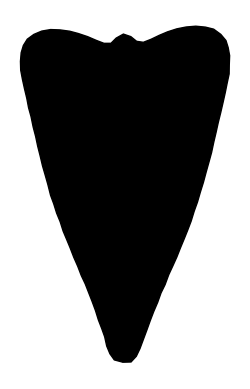

In [14]:
plt.fill(mean_g20[:,0], mean_g20[:,1], c = "black")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('mean_g20_120825.png', dpi= 300, bbox_inches='tight')

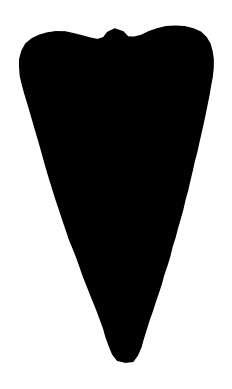

In [15]:
plt.fill(mean_g2[:,0], mean_g2[:,1], c = "black")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('mean_g2_120825.png', dpi= 300, bbox_inches='tight')

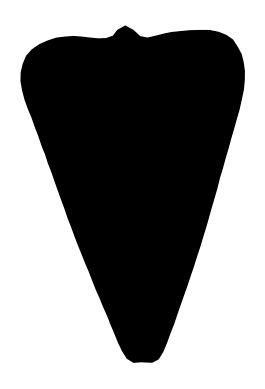

In [16]:
plt.fill(mean_g14[:,0], mean_g14[:,1], c = "black")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('mean_g14_120825.png', dpi= 300, bbox_inches='tight')

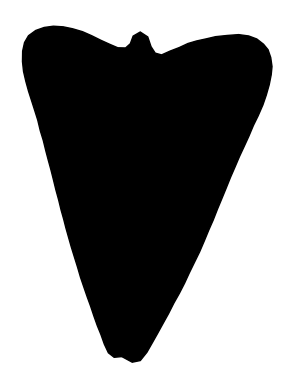

In [17]:
plt.fill(mean_g7[:,0], mean_g7[:,1], c = "black")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('mean_g7_120825.png', dpi= 300, bbox_inches='tight')

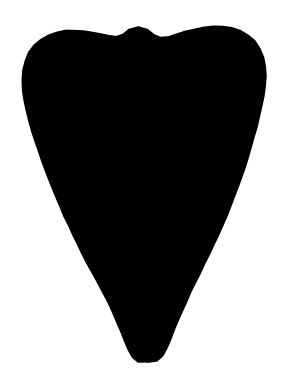

In [18]:
plt.fill(mean_gM6[:,0], mean_gM6[:,1], c = "black")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('mean_gM6_120825.png', dpi= 300, bbox_inches='tight')

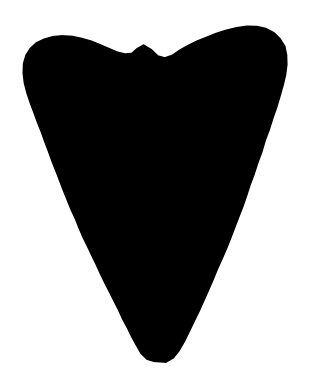

In [183]:
plt.fill(mean_t16[:,0], mean_t16[:,1], c = "black")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('t16_mean_112525.png', dpi= 300, bbox_inches='tight')

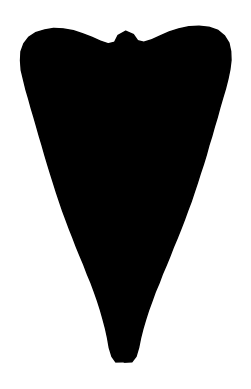

In [184]:
plt.fill(mean_t20[:,0], mean_t20[:,1], c = "black")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('t20_mean_112525.png', dpi= 300, bbox_inches='tight')

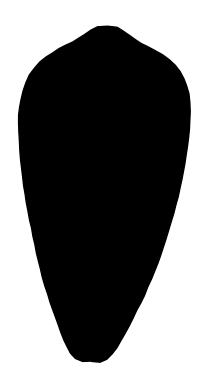

In [185]:
plt.fill(mean_t30[:,0], mean_t30[:,1], c = "black")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('t30_mean_112525.png', dpi= 300, bbox_inches='tight')

### Mean Magnolia6 11//25

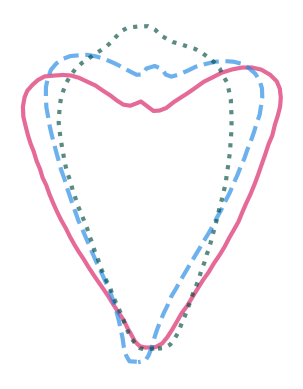

In [141]:
plt.plot(mean_gM6_c16[:,0], mean_gM6_c16[:,1], c = "#D81B60", lw = 3, linestyle='solid', alpha = 0.65)
plt.plot(mean_gM6_c20[:,0], mean_gM6_c20[:,1], c = "#1E88E5", lw = 3, linestyle='dashed', alpha = 0.65)
plt.plot(mean_gM6_c30[:,0], mean_gM6_c30[:,1], c = "#004D40", lw = 3, linestyle='dotted', alpha = 0.65)
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('g6C_temp_comp_111425.png', dpi= 300, bbox_inches='tight')

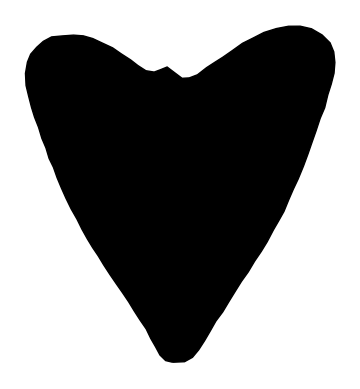

In [142]:
plt.fill(mean_gM6_c16[:,0], mean_gM6_c16[:,1], c = "black")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('g6C_temp_c16_111425.png', dpi= 300, bbox_inches='tight')

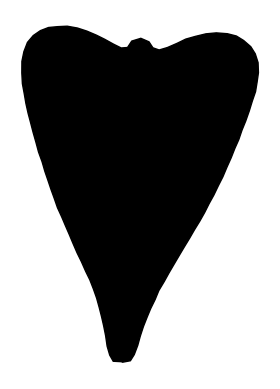

In [143]:
plt.fill(mean_gM6_c20[:,0], mean_gM6_c20[:,1], c = "black")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('g6C_temp_20_111425.png', dpi= 300, bbox_inches='tight')

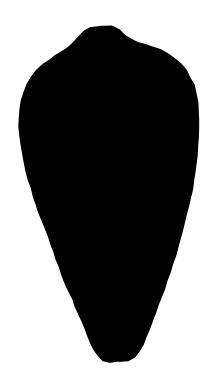

In [144]:
plt.fill(mean_gM6_c30[:,0], mean_gM6_c30[:,1], c = "black")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('g6C_temp_30_111425.png', dpi= 300, bbox_inches='tight')

### Mean 14.2 11/14/25

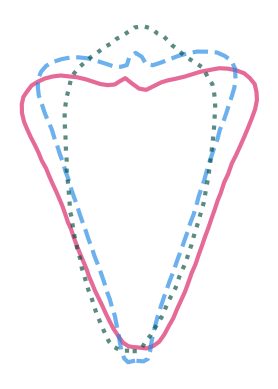

In [145]:
plt.plot(mean_g14_c16[:,0], mean_g14_c16[:,1], c = "#D81B60", lw = 3, linestyle='solid', alpha = 0.65)
plt.plot(mean_g14_c20[:,0], mean_g14_c20[:,1], c = "#1E88E5", lw = 3, linestyle='dashed', alpha = 0.65)
plt.plot(mean_g14_c30[:,0], mean_g14_c30[:,1], c = "#004D40", lw = 3, linestyle='dotted', alpha = 0.65)
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('g14_temp_comp_111425.png', dpi= 300, bbox_inches='tight')

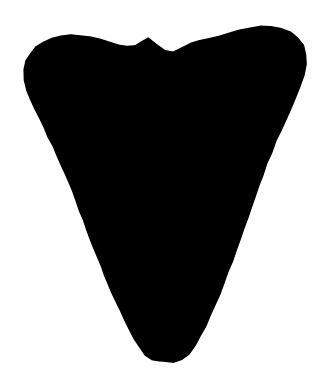

In [146]:
plt.fill(mean_g14_c16[:,0], mean_g14_c16[:,1], c = "black")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('g14_temp_16_111425.png', dpi= 300, bbox_inches='tight')

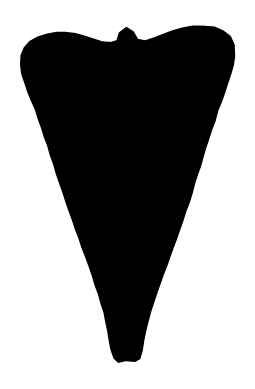

In [147]:
plt.fill(mean_g14_c20[:,0], mean_g14_c20[:,1], c = "black")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('g14_temp_20_111425.png', dpi= 300, bbox_inches='tight')

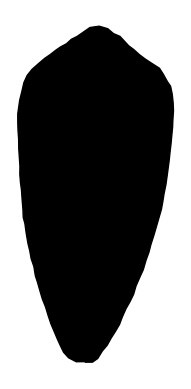

In [148]:
plt.fill(mean_g14_c30[:,0], mean_g14_c30[:,1], c = "black")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('g14_temp_30_111425.png', dpi= 300, bbox_inches='tight')

### Mean 2.16 11/14/25

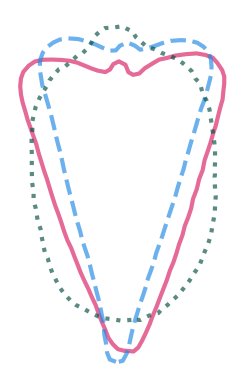

In [149]:
plt.plot(mean_g2_c16[:,0], mean_g2_c16[:,1], c = "#D81B60", lw = 3, linestyle='solid', alpha = 0.65)
plt.plot(mean_g2_c20[:,0], mean_g2_c20[:,1], c = "#1E88E5", lw = 3, linestyle='dashed', alpha = 0.65)
plt.plot(mean_g2_c30[:,0], mean_g2_c30[:,1], c = "#004D40", lw = 3, linestyle='dotted', alpha = 0.65)
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('g2_temp_comp_111425.png', dpi= 300, bbox_inches='tight')

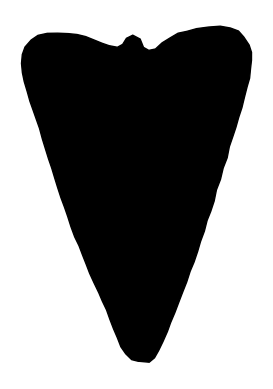

In [150]:
plt.fill(mean_g2_c16[:,0], mean_g2_c16[:,1], c = "black")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('g2_temp_16_111425.png', dpi= 300, bbox_inches='tight')

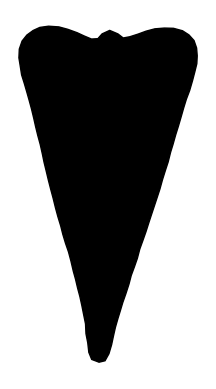

In [151]:
plt.fill(mean_g2_c20[:,0], mean_g2_c20[:,1], c = "black")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('g2_temp_20_111425.png', dpi= 300, bbox_inches='tight')

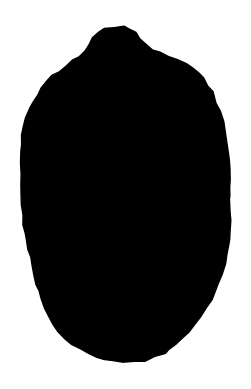

In [152]:
plt.fill(mean_g2_c30[:,0], mean_g2_c30[:,1], c = "black")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('g2_temp_30_111425.png', dpi= 300, bbox_inches='tight')

### Mean 20.295 11/14/25

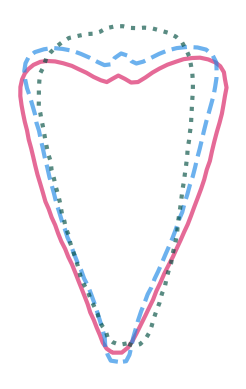

In [153]:
plt.plot(mean_g20_c16[:,0], mean_g20_c16[:,1], c = "#D81B60", lw = 3, linestyle='solid', alpha = 0.65)
plt.plot(mean_g20_c20[:,0], mean_g20_c20[:,1], c = "#1E88E5", lw = 3, linestyle='dashed', alpha = 0.65)
plt.plot(mean_g20_c30[:,0], mean_g20_c30[:,1], c = "#004D40", lw = 3, linestyle='dotted', alpha = 0.65)
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('g20_temp_comp_111425.png', dpi= 300, bbox_inches='tight')

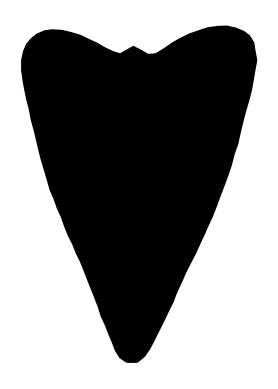

In [154]:
plt.fill(mean_g20_c16[:,0], mean_g20_c16[:,1], c = "black")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('g20_temp_16_111425.png', dpi= 300, bbox_inches='tight')

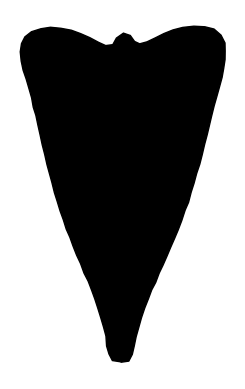

In [155]:
plt.fill(mean_g20_c20[:,0], mean_g20_c20[:,1], c = "black")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('g20_temp_20_111425.png', dpi= 300, bbox_inches='tight')

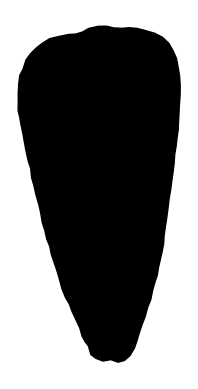

In [156]:
plt.fill(mean_g20_c30[:,0], mean_g20_c30[:,1], c = "black")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('g20_temp_30_111425.png', dpi= 300, bbox_inches='tight')

### Mean 7.99 11/14/25m

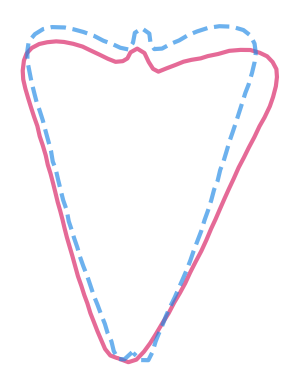

In [157]:
plt.plot(mean_g7_c16[:,0], mean_g7_c16[:,1], c = "#D81B60", lw = 3, linestyle='solid', alpha = 0.65)
plt.plot(mean_g7_c20[:,0], mean_g7_c20[:,1], c = "#1E88E5", lw = 3, linestyle='dashed', alpha = 0.65)
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('g7_temp_comp_111425.png', dpi= 300, bbox_inches='tight')

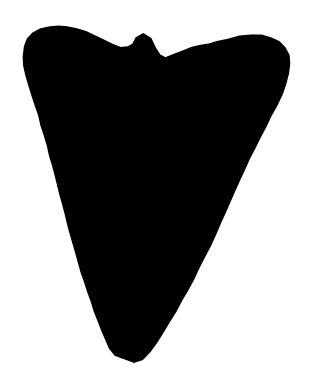

In [158]:
plt.fill(mean_g7_c16[:,0], mean_g7_c16[:,1], c = "black")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('g7_temp_16_111425.png', dpi= 300, bbox_inches='tight')

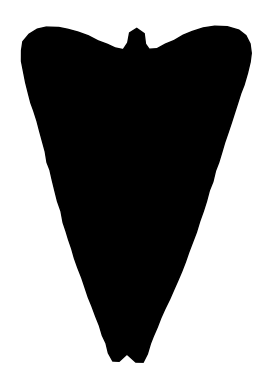

In [159]:
plt.fill(mean_g7_c20[:,0], mean_g7_c20[:,1], c = "black")
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig('g7_temp_20_111425.png', dpi= 300, bbox_inches='tight')

# Calculating angle of heart valves 11/24/25

Function to calculate angle of heart valves. Using ImageJ, I selected the apex of the left valve (L_x, L_y), apex of the right valve (R_x,R_y), mid-point (M_x,M_y) of the replum. 

In [160]:
def calculate_angle(x1, y1, xm, ym, xt, yt):
    """
    Compute the angle at point M between points (X1, Y1) -> (M) -> (T).
    """
    # vector from M to point 1
    v1 = np.array([x1 - xm, y1 - ym])
    # vector from M to tip
    v2 = np.array([xt - xm, yt - ym])
    
    # dot product and magnitudes
    dot = np.dot(v1, v2)
    norm_v1 = np.linalg.norm(v1)
    norm_v2 = np.linalg.norm(v2)
    
    # avoid divide-by-zero
    if norm_v1 == 0 or norm_v2 == 0:
        return np.nan
    
    # clamp for numerical stability
    cos_theta = np.clip(dot / (norm_v1 * norm_v2), -1.0, 1.0)
    
    # return degrees
    return np.degrees(np.arccos(cos_theta))

In [162]:
mdata2["left_angle"] = mdata2.apply(
    lambda row: calculate_angle(
        row["L_x"], row["L_y"],
        row["M_x"], row["M_y"],
        row["tip_x"], row["tip_y"]
    ), axis=1
)

In [165]:
mdata2["right_angle"] = mdata2.apply(
    lambda row: calculate_angle(
        row["R_x"], row["R_y"],
        row["M_x"], row["M_y"],
        row["tip_x"], row["tip_y"]
    ), axis=1
)

In [167]:
# save dataframe with angles

mdata2.to_csv('metadata_angles_112425.csv', header=True)